# Load data from Kaggle

In [ ]:
# https://stackoverflow.com/questions/49310470/using-kaggle-datasets-in-google-colab
# Run this cell and select the kaggle.json file downloaded
# from the Kaggle account settings page.
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"suhasaithal","key":"c87c41921fe9344b9c854878138972be"}'}

In [ ]:
# Let's make sure the kaggle.json file is present.
!ls -lha kaggle.json

-rw-r--r-- 1 root root 67 Nov 24 04:47 kaggle.json


In [ ]:
# Next, install the Kaggle API client.
!pip install -q kaggle

In [ ]:
# The Kaggle API client expects this file to be in ~/.kaggle,
# so move it there.
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

# This permissions change avoids a warning on Kaggle tool startup.
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# Download data from Kaggle using its API
!kaggle competitions download -c vsb-power-line-fault-detection

  0% 0.00/158k [00:00<?, ?B/s]
100% 158k/158k [00:00<00:00, 60.6MB/s]
100% 6.97G/6.97G [04:14<00:00, 46.7MB/s]
100% 6.97G/6.97G [04:14<00:00, 29.4MB/s]
  0% 0.00/257k [00:00<?, ?B/s]
100% 257k/257k [00:00<00:00, 82.6MB/s]
  0% 0.00/115k [00:00<?, ?B/s]
100% 115k/115k [00:00<00:00, 102MB/s]
100% 3.02G/3.02G [02:18<00:00, 18.5MB/s]
100% 3.02G/3.02G [02:18<00:00, 23.4MB/s]


In [ ]:
# https://stackoverflow.com/questions/49685924/extract-google-drive-zip-from-google-colab-notebook
# !unzip /content/train.parquet.zip
# !unzip /content/test.parquet.zip

# Load Libraries

In [ ]:
!sudo apt-get install libsnappy-dev
!pip install python-snappy
!pip install fastparquet
!pip install kneed

# https://github.com/raphaelvallat/entropy/issues/4#issue-533857629
!pip install git+https://github.com/raphaelvallat/entropy.git

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  libsnappy-dev
0 upgraded, 1 newly installed, 0 to remove and 14 not upgraded.
Need to get 27.2 kB of archives.
After this operation, 108 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 libsnappy-dev amd64 1.1.7-1 [27.2 kB]
Fetched 27.2 kB in 1s (36.4 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package libsnappy-dev:amd64.
(Reading database ... 144793 files and

In [ ]:
import numpy as np
import pandas as pd
import dask as dd
import pyarrow.parquet as pq
import pyarrow as pa
import os
%matplotlib inline
import matplotlib 
import matplotlib.pyplot as plt
plt.style.use('seaborn')
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm
from scipy.stats import norm, skew

import gc
import pywt
from statsmodels.robust import mad
import scipy
from scipy import signal
from scipy.signal import butter
from scipy.signal import find_peaks, peak_widths, peak_prominences

from datetime import datetime

from scipy.signal import periodogram
from sklearn.neighbors import KDTree

from keras.layers import *
from keras.models import *
from keras import backend as K # The backend gives us access to tensorflow operations and allow us to create attention class
from keras import optimizers # Allows to access Adam class and modify some parameters
from keras.callbacks import * # This object helps the model to train in a smarter way, avoid overfitting
from keras import activations
from keras import regularizers
from keras import initializers
from keras import constraints
from keras.utils.vis_utils import plot_model
import tensorboard
%load_ext tensorboard
import tensorflow.compat.v1 as tf

# https://stackoverflow.com/a/56569206/4699076
tf.disable_eager_execution()

from sklearn.model_selection import GridSearchCV, StratifiedKFold

import concurrent.futures
import multiprocessing
from kneed import KneeLocator
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import matthews_corrcoef
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
import lightgbm as lgb
from sklearn.linear_model import SGDRegressor
from IPython.display import Image
from sklearn.metrics import matthews_corrcoef
import numba
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import make_scorer
from sklearn.metrics import confusion_matrix

import scipy.stats as stats
import pylab
from sklearn.ensemble import RandomForestClassifier
import random
import pickle
from sklearn.metrics import log_loss
from entropy import *
from prettytable import PrettyTable
import lightgbm as lgb

from sklearn.preprocessing import OneHotEncoder
from itertools import combinations

import warnings
warnings.filterwarnings('ignore')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from google.colab import drive
from google.colab import output
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = '/content/drive/My Drive/Colab Notebooks/Assignment_29-VSB_Power_Line/'
test_path = '/content/drive/My Drive/Colab Notebooks/Assignment_29-VSB_Power_Line/test_path'

# Read Data

In [ ]:
metadata_train = pd.read_csv("/content/metadata_train.csv")
metadata_test = pd.read_csv("/content/metadata_test.csv")

# train = pd.read_parquet('/content/train.parquet', engine='fastparquet')
# test = pd.read_parquet('/content/test.parquet', engine='fastparquet')

# Featurization

## Utility Functions

**General**

In [ ]:
def parallel_proc_func(func, cols, no_signals, init_offset, 
                       save_file_path='None', *args):
  """
  Perform parallel processing of the given function. 
  If a function has to be parallelized over several items (signal_ids), then they
  can be parallelized based on the number of cores present in the CPU.
  The results are stored in a csv file.

  Parameters
  ----------
  func : function object
    The function which is to be run parallely.
  cols : numpy.ndarray
    Names of the result columns that is to be stored in the csv file
  no_signals : int
    Total number of signals to be processed
  init_offset : int
    Initial offset of the item (signal_id) from where the iterations are to begin
  save_file_path : string (Default - 'None')
    Path of the csv file where the results are to be stored.
    If None, resulting dataframe is returned.
  *args : Tuple
    Additional parameters (along with signal id) that are needed for the func 
    object.  

  Returns
  -------
  None (Default)
    If the file has to be saved, then the resultant data frame is stored in the
    respective save_file_path. Hence, nothing is returned.
  df : pandas.DataFrame
    If the file is not to be saved, then the resultant data frame is returned.
  """
  # Get number of cores in cpu: https://stackoverflow.com/a/1006337/4699076
  batch_size = multiprocessing.cpu_count() # no. of cores in the cpu, needed for parallel processing  
  end_val = no_signals//batch_size
  # Save the file after processing (save_pt*batch_size) number of signals
  save_pt = end_val//10
  if save_pt == 0:
    save_pt = 1

  # Check if file is already processed
  if os.path.isfile(save_file_path):
    df = pd.read_csv(save_file_path)
    df.drop(['Unnamed: 0'], axis=1, inplace=True)
    start_val = df.shape[0]//batch_size
    print(f"{df.shape[0]} signal ids already processed.")
    print("Processing the remaining signal ids...")    
  else:
    # If specific columns are given, then create a dataframe with the given columns
    if cols != 'None':
      df = pd.DataFrame(columns=cols)
    # Create an empty dataframe if no columns given
    else:
      df = pd.DataFrame()
    if save_file_path != 'None':
      df.to_csv(save_file_path)
    
    start_val = 0
  
  start_batch = datetime.now()
  # Begin iteration
  for i in range(start_val, end_val):
    sig_id = np.arange(init_offset+(i*batch_size),
                        init_offset+(i*batch_size)+batch_size)
    # If additional arguments are provided for 'func' object, 
    # then create a list containing signal ids and new argument
    if len(args) != 0:
      func_args = [(x, args[0]) for x in sig_id]
    # If new arguments are not provided, then create a list of signal ids
    else:
      func_args = sig_id
    
    # Begin parallel processing
    with concurrent.futures.ProcessPoolExecutor() as executor:
      results = executor.map(func, func_args)
      for result in results:
        # For dataframe with pre-defined columns
        if cols != 'None':
          temp_df = pd.DataFrame(data=[result], columns=cols)
        # For dataframes with no pre-defined columns
        else:
          temp_df = pd.DataFrame(data=[result])
        df = df.append(temp_df, ignore_index=True)

    # Save file at the checkpoint
    if ((i+1)%save_pt==0):
      # Calculate and print the number of signals processed
      no_sigs_processed = (i+1)*batch_size
      print(f"{no_sigs_processed} ({np.round(((no_sigs_processed)/no_signals)*100, 2)}%) signals completed. Time taken: {datetime.now() - start_batch}")
      if save_file_path != 'None':
        df.to_csv(save_file_path)
      start_batch = datetime.now()

  # If all the signals are already processed, then start_val will be equal to end_val. 
  if start_val != end_val:
    no_signals_remaining = no_signals%batch_size
    if no_signals_remaining!=0:
      sig_id = np.arange(init_offset+(end_val*batch_size),
                        init_offset+(end_val*batch_size)+no_signals_remaining)
      if len(args) != 0:
        func_args = [(x, args[0]) for x in sig_id]
      else:
        func_args = sig_id

      # Parallel processing
      with concurrent.futures.ProcessPoolExecutor() as executor:
        results = executor.map(func, func_args)
        for result in results:
          if cols != 'None':
            temp_df = pd.DataFrame(data=[result], columns=cols)
          else:
            temp_df = pd.DataFrame(data=[result])
          df = df.append(temp_df, ignore_index=True)

  no_sigs_processed = no_signals
  print(f"{no_sigs_processed} ({np.round(((no_sigs_processed)/no_signals)*100, 2)}%) signals completed. Time taken: {datetime.now() - start_batch}")
  if save_file_path != 'None':
    df.to_csv(save_file_path)
  if save_file_path == 'None':
    return df

**Plots**

In [ ]:
def get_knee(sorted_arr_len, vals_sorted, sensitivity, curve, direction):
  # https://github.com/arvkevi/kneed
  kneedle = KneeLocator(np.arange(len(vals_sorted)), vals_sorted, S=sensitivity, 
                        curve=curve, direction='increasing')
  knee = kneedle.knee_y
  knee_ind = kneedle.knee
  return knee, knee_ind  

def plot_knee(feat_name, vals_sorted, target_marker, knee, knee_ind, compare):
  """
  Plot the knee plot of the signal.

  Parameters
  ----------
  feat_name : string
    Name of the feature which is to be plotted.
    This is used for labelling the plot.
  vals_sorted : numpy.ndarray
    The x values of the plot.
  target_marker : numpy.ndarray
    Get the indices where the respective signal has target=1
  knee : numpy.float64
    The knee value of the series.
  knee_ind : int
    Index in the series where the knee value is obtained.
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.
  
  Returns
  -------
  None : Function does not return any value
  """
  if not compare:
    plt.figure(figsize=(20,5))
  x_vals = np.arange(len(vals_sorted))  
  plt.plot(x_vals, vals_sorted, label='target=1', marker='s', markevery=target_marker)
  plt.plot(x_vals, vals_sorted, label='target=0')
  plt.vlines(knee_ind, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', label='Knee Value ({})'.format(knee))
  plt.legend()
  plt.xlabel('Signal Number')
  plt.ylabel(feat_name)
  if compare:
    plt.suptitle('{} Knee Plot - All Phases'.format(feat_name))
  else:
    plt.title('{} Knee Plot - All Phases'.format(feat_name))
    plt.show()
    print('='*100)

def plot_vs_sigid(temp_metadata, feat_name, target_index, knee, compare):
  """
  Plot the feature value of the signal with respect to its signal id.

  Parameters
  ----------
  temp_metadata : pandas.DataFrame
    Dataframe containing information of the features along with measurement id
    and target information for that measurement id.
  feat_name : string
    Name of the feature that is to be plotted.
  target_index : numpy.ndarray
    Index value where that respective measurement id has target=1
  knee : numpy.float64
    Knee value for that feature.
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.

  Returns
  -------
  None : Function does not return any value  
  """
  x_vals = np.arange(temp_metadata.shape[0])
  if not compare:
    plt.figure(figsize=(25,10))
  plt.plot(x_vals, temp_metadata[feat_name].values, label='target=0')
  # https://stackoverflow.com/questions/21285885/remove-line-through-marker-in-matplotlib-legend
  plt.plot(x_vals, temp_metadata[feat_name].values, marker='s', markerfacecolor='red', 
          markevery=list(target_index), label='target=1', linestyle='None')
  plt.hlines(knee, plt.xlim()[0], plt.xlim()[1], linestyles='dashed', label='Knee Value ({})'.format(knee))
  plt.legend()
  plt.xlabel('Signal ID')
  plt.ylabel(feat_name)
  if compare:
    plt.suptitle('{} Vs. Signal ID'.format(feat_name))    
  else:    
    plt.title('{} Vs. Signal ID'.format(feat_name))
    plt.show()
    print('='*100)    

def plot_pdf(temp_metadata, feat_name, knee, compare):
  """
  Plot the Probability Density Function for the given feature.

  Parameters
  ----------
  temp_metadata : pandas.DataFrame
    Dataframe containing information of the features along with measurement id
    and target information for that measurement id.
  feat_name : string
    Name of the feature that is to be plotted.
  knee : numpy.float64
    Knee value for that feature.
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.

  Returns
  -------
  None : Function does not return any value
  """
  target = temp_metadata[temp_metadata['target']==1][feat_name].values
  no_target = temp_metadata[temp_metadata['target']==0][feat_name].values

  if not compare:
    print("Mean of all {} values: {}".format(feat_name, np.mean(temp_metadata[feat_name].values)))
    print("Mean of {} with target=1: {}".format(feat_name, np.mean(target)))
    print("Mean of {} with target=0: {}".format(feat_name, np.mean(no_target)))  
    plt.figure(figsize=(15,5))

  ax1 = sns.distplot(temp_metadata[feat_name].values, kde=True, hist=False, label='combined')
  ax2 = sns.distplot(target, kde=True, hist=False, label='target=1')
  ax3 = sns.distplot(no_target, kde=True, hist=False, label='target=0', )

  ax1.axvline(np.mean(temp_metadata[feat_name].values), color='blue')
  ax2.axvline(np.mean(target), color='green')
  ax3.axvline(np.mean(no_target), color='red')

  plt.vlines(knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', label='Knee Value ({})'.format(knee))
  plt.legend()
  plt.xlabel(feat_name)
  plt.ylabel('PDF')
  if compare:
    plt.suptitle('PDF of {}'.format(feat_name))
  else:
    plt.title('PDF of {}'.format(feat_name))
    plt.show()
    print('='*100)

def plot_cdf(feat_name, vals_sorted, knee, compare):
  """
  Plot the Cumulative Density Function of the given feature.

  Parameters
  ----------
  feat_name : string
    Name of the feature that is to be plotted.
  vals_sorted : numpy.ndarray
    x values of the plot.
  knee : numpy.float64
    Knee value for that feature.
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.

  Returns
  -------
  None : Function does not return any value
  """
  knee_perc = (((np.where(vals_sorted==knee)[0][0])/len(vals_sorted))*100)
  percentile_vals = []
  perc = 0
  for ind, val in enumerate(vals_sorted):
    if ind==int(perc*len(vals_sorted)):
      percentile_vals.append(val)      
      perc += 0.01
  percentile_vals.append(vals_sorted[-1])
  y_vals = np.linspace(0, 1, 101)

  if not compare:
    plt.figure(figsize=(15,5))
  plt.plot(percentile_vals, y_vals)
  plt.vlines(knee, plt.ylim()[0], plt.ylim()[1], linestyle='dashed', label='Knee Value ({})'.format(knee))
  plt.hlines((knee_perc/100), plt.xlim()[0], plt.xlim()[1], linestyles='dashdot', label='Knee Value Percentile ({}%)'.format(np.round(knee_perc,2)))
  plt.legend(loc='lower right')
  plt.xlabel(feat_name)
  plt.ylabel('CDF')
  if compare:
    plt.suptitle('CDF of {}'.format(feat_name))
  else:
    plt.title('CDF of {}'.format(feat_name))
    plt.show()
    print('='*100)

def plot_box(temp_metadata, feat_name, vals_sorted, knee, compare):
  """
  Plot the box plot for the given feature.

  Parameters
  ----------
  temp_metadata : pandas.DataFrame
    Dataframe containing information of the features along with measurement id
    and target information for that measurement id.  
  feat_name : string
    Name of the feature that is to be plotted.
  vals_sorted : numpy.ndarray
    x values of the plot.
  knee : numpy.float64
    Knee value for that feature.
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.

  Returns
  -------
  None : Function does not return any value
  """
  knee_perc = (((np.where(vals_sorted==knee)[0][0])/len(vals_sorted))*100)
  sns.boxplot(x=temp_metadata['target'], y=temp_metadata[feat_name])
  plt.hlines(knee, plt.xlim()[0], plt.xlim()[1], linestyles='dashed', label='Knee Value Percentile ({}%)'.format(np.round(knee_perc,2)))
  plt.legend()
  if compare:
    plt.suptitle('Box plot of signals with target=0 and target=1')
  else:
    plt.title('Box plot of signals with target=0 and target=1')
    plt.show()  
    print('='*100)

def logistic_plot(temp_metadata, feat_name, compare):
  """
  Plot logistic plot for the given feature.

  Parameters
  ----------
  temp_metadata : pandas.DataFrame
    Dataframe containing information of the features along with measurement id
    and target information for that measurement id.  
  feat_name : string
    Name of the feature that is to be plotted.  
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.

  Returns
  -------
  None : Function does not return any value

  References
  ----------
  .. [1] https://www.kaggle.com/mark4h/vsb-1st-place-solution
  """
  sns.set_context("paper", font_scale=2)
  # fig, ax = plt.subplots(1, 1, figsize=(8, 6))
  sns.regplot(feat_name, 'target', temp_metadata, logistic=True, 
              n_boot=100, y_jitter=.1, 
              scatter_kws={'alpha':0.1, 'edgecolor':'none'})
  if compare:
    plt.suptitle('Logistic plot of signals with target=0 and target=1')
  else:
    plt.title('Logistic plot of signals with target=0 and target=1')
    plt.show()
    print('='*100)

In [ ]:
def feature_eda(temp_metadata, feat_name, plot_name, phase, compare, 
                sensitivity=1, curve='convex'):
  """
  Performs Exploratory Data Analysis for the given feature.

  Following information is displayed upon calling this function:
  * Knee plot
  * Feature value vs. signal id
  * PDF
  * CDF
  * Box plot
  * Logistic plot
  * Statistics

  Parameters
  ----------
  temp_metadata : pandas.DataFrame
    Dataframe containing information of the features along with measurement id
    and target information for that measurement id.  
  feat_name : string
    Name of the feature that is to be plotted.
  plot_name : string
    Name of the plot that is to be displayed.
    Following are the valid strings for the plot:
    * 'knee' - to display only knee plot
    * 'sigid' - to display only feature vs. signal id plot
    * 'pdf' - to display only the pdf plot
    * 'cdf' - to display only the cdf plot
    * 'box' - to display only the box plot
    * 'stats' - to display only statisticss
    * 'all' - to display all the plots and statistics
  phase : string
    This is to process the features with respect to signal id or with respect
    to measurement id.
    Following are valid strings:
    * 'one_phase' - when feature is calculated for each signal id
    * 'multi_phase' - when 3 phases of the signal is combined and processed
  compare : boolean
    If True plots are displayed in a subplot for comparing the two plots.
    If False then the entire space is used to display the plot.
  sensitivity : float (Default=1)
    This value adjusts the position where the knee value is to be detected.
  curve : string (Default='convex')
    How the values sorted in the ascending order look like.
    If 'convex' - sorted values look like exp(x) curve
    If 'concave' - sorted values look like sigmoid(x) curve
    
  Returns
  -------
  None : Function does not return any value
  """
  # Get the indices where the target is 1
  if phase=='one_phase':
    target_index = temp_metadata[temp_metadata['target']==1]['signal_id'].values
  elif phase=='multi_phase':
    target_index = temp_metadata[temp_metadata['target']==1]['id_measurement'].values

  # Sort the feature values in ascending order
  vals_sorted = np.sort(temp_metadata[feat_name].values)

  # Get the original indices of the sorted feature values
  vals_ind = np.argsort(temp_metadata[feat_name].values)

  # Get the original indices of the sorted feature values where target is 1
  target_marker = []
  for ind, val in enumerate(target_index):
    target_marker.append(np.where(vals_ind==val)[0][0])

  # https://github.com/arvkevi/kneed
  kneedle = KneeLocator(np.arange(len(vals_sorted)), vals_sorted, S=sensitivity, 
                        curve=curve, direction='increasing')
  knee = kneedle.knee_y
  knee_ind = kneedle.knee

  # If plot_name = 'all', then plot all the graphs
  # Else plot the respective graphs
  # Plot knee plot
  if (plot_name=='all') | (plot_name=='knee'):
    plot_knee(feat_name, vals_sorted, target_marker, knee, knee_ind, compare)
  
  if (plot_name=='all') & (not compare):
    print("The knee value of the {} is: {}".format(feat_name, knee))
    print(f"Number of signals with {feat_name} greater than {knee} and target=1: {len(np.where(np.array(target_marker) > knee_ind)[0])}({np.round((len(np.where(np.array(target_marker) > knee_ind)[0]) / temp_metadata.shape[0])*100 , 2)}%)")
    print(f"Number of signals with {feat_name} greater than {knee} and target=0: {len(np.where(vals_sorted > knee)[0])}({np.round((len(np.where(vals_sorted > knee)[0]) / temp_metadata.shape[0])*100 , 2)}%)")
    print("Number of signals with target=1: {}".format(len(target_index)))

  # Plot feature values vs signal id
  if (plot_name=='all') | (plot_name=='sigid'):
    plot_vs_sigid(temp_metadata, feat_name, target_index, knee, compare)

  # Plot PDF
  if (plot_name=='all') | (plot_name=='pdf'):
    plot_pdf(temp_metadata, feat_name, knee, compare)

  # Plot CDF
  if (plot_name=='all') | (plot_name=='cdf'):
    plot_cdf(feat_name, vals_sorted, knee, compare)

  # Plot box plot
  if (plot_name=='all') | (plot_name=='box'):
    plot_box(temp_metadata, feat_name, vals_sorted, knee, compare)
  
  # Plot logistic plot
  if (plot_name=='all') | (plot_name=='logistic'):
    logistic_plot(temp_metadata, feat_name, compare)
  
  # Print statistics
  if ((plot_name=='all') | (plot_name=='stats')) & (not compare):
    # https://stackoverflow.com/questions/34816769/getting-values-in-seaborn-boxplot
    stats = temp_metadata[feat_name].describe()
    print(f"Statistics of all signals:\n{stats}")    
    print(f"Inter Quartile Range of all Signals: {stats[6]-stats[4]}\n")

    stats = temp_metadata.groupby('target')[feat_name].describe().iloc[0]    
    print(f"Statistics of signals with target=0:\n{stats}")
    print(f"Inter Quartile Range of all signals with target=0: {stats[6]-stats[4]}\n")

    stats = temp_metadata.groupby('target')[feat_name].describe().iloc[1]
    print(f"Statistics of signals with target=1:\n{stats}")
    print(f"Inter Quartile Range of all signals with target=1: {stats[6]-stats[4]}\n")

def pca_plots(threshold_pos, threshold_neg, all_feats_df, cols, labels):
  """
  Plots PCA plot for the given data.

  Parameters
  ----------
  threshold_pos : float
    Positive threshold value for the mean correlation value for each feature.
    It will select only those features whose mean correlation value is less than
    this value.
  threshold_neg : float
    Negative threshold value for the mean correlation value for each feature.
    It will select only those features whose mean correlation value is greater 
    than this value.
  all_feats_df : pandas.DataFrame
    Dataframe containing all the feature values. 
    These feature values are not standardized.
  cols : list
    List of names of all the features.    

  Returns
  -------
  pca_df : pandas.DataFrame
    Dataframe comprising the reduced dimension.
  pca_cols : list
    List of strings specifying the selected columns for the given thresholds.
  pca.explained_variance_ : numpy.array
    Explained variance values (lambda) corresponding to each principal
    component.
  """  
  pca_cols = []
  # Select the features whose mean correlation value lies between positive and 
  # negative threshold values
  for ind, col in enumerate(cols):
    if mean_corr[ind] < threshold_pos and mean_corr[ind] > threshold_neg:
      pca_cols.append(col)
  # Standardize the features
  std = StandardScaler()
  s = std.fit_transform(all_feats_df[pca_cols])

  # Get all the principal components
  pca = PCA()
  pca_s = pca.fit_transform(s)
  pca_df = pd.DataFrame(pca_s[:,0:2], columns=['1st_principal', '2nd_principal'])
  pca_df['label'] = labels  
  return pca_df, pca_cols, pca.explained_variance_

def tsne_plots(threshold_pos, threshold_neg, all_feats_df, cols, labels, perp, iter):
  """
  Plots TSNE plot for the given data.

  Parameters
  ----------
  threshold_pos : float
    Positive threshold value for the mean correlation value for each feature.
    It will select only those features whose mean correlation value is less than
    this value.
  threshold_neg : float
    Negative threshold value for the mean correlation value for each feature.
    It will select only those features whose mean correlation value is greater 
    than this value.
  all_feats_df : pandas.DataFrame
    Dataframe containing all the feature values. 
    These feature values are not standardized.
  cols : list
    List of names of all the features.        
  perp : int
    Specify the required perplexity in the TSNE plot.
  iter : int
    Specify the number of iterations to run for the TSNE plot.

  Returns
  -------
  tsne_df : pandas.DataFrame
    Dataframe comprising the reduced dimension.    
  """
  tsne_cols = []
  # Select the features whose mean correlation value lies between positive and 
  # negative threshold values
  for ind, col in enumerate(cols):
    if mean_corr[ind] < threshold_pos and mean_corr[ind] > threshold_neg:
      tsne_cols.append(col)
  # Standardize the features
  std = StandardScaler()
  s = std.fit_transform(all_feats_df[tsne_cols])
  tsne = TSNE(n_components=2, perplexity=perp, n_iter=iter, random_state=42)
  tsne_s = tsne.fit_transform(s)
  tsne_df = pd.DataFrame(tsne_s, columns=['Dim_1','Dim_2'])
  tsne_df['label'] = labels
  return tsne_df  


In [ ]:
plt_list = ['knee', 'sigid', 'pdf', 'cdf', 'box', 'logistic']
title_names = ['Original', 'Outlier processed']

def plot_compare(feat_name, phase, plt_list=plt_list, title_names=title_names, *args):
  """
  Display the plots side by side for comparison.

  Parameters
  ----------
  feat_name : string
    Name of the feature to be compared in the Dataframe 1.
  plt_list : list
    Names of the plots to be displayed
  original_df : pandas.DataFrame
    Dataframe 1 to be compared.
  denoised_df : pandas.DataFrame
    Dataframe 2 to be compared.
  phase : string
    This is to process the features with respect to signal id or with respect
    to measurement id.
    Following are valid strings:
    * 'one_phase' - when feature is calculated for each signal id
    * 'multi_phase' - when 3 phases of the signal is combined and processed

  Returns
  -------
  None : Function does not return any value
  """
  no_plts = len(plt_list)
  no_compares = len(args[0])  
  for ind, plt_name in enumerate(plt_list):    
    for args_val in args:
      plt.figure(figsize=(100,25))
      count = 0
      for df_ind, df in enumerate(args_val):
        count += 1               
        # plt.subplot(no_plts,no_compares,count)
        plt.subplot(1,no_compares,count)
        feature_eda(df, feat_name, plt_name, phase, True, 1)
        plt.title(title_names[df_ind])
      plt.show()
      print('='*150)

def plot_multi_compare(feat_list, phase, plt_list, df):
  """
  Display multiple plots side by side for comparison. 
  Here the comparison is among different features of the single dataframe.

  Parameters
  ----------
  feat_list : list
    List of names of the features to be compared in the Dataframe df.
  phase : string
    This is to process the features with respect to signal id or with respect
    to measurement id.
    Following are valid strings:
    * 'one_phase' - when feature is calculated for each signal id
    * 'multi_phase' - when 3 phases of the signal is combined and processed    
  plt_list : list
    Names of the plots to be displayed
  df : pandas.DataFrame
    Dataframe containing the features to be compared.

  Returns
  -------
  None : Function does not return any value
  """  
  no_plts = len(plt_list)
  no_compares = len(feat_list)    
  for ind, plt_name in enumerate(plt_list):
    plt.figure(figsize=(100,25))
    count = 0
    for feat_ind, feat_name in enumerate(feat_list):
      count += 1
      plt.subplot(1, no_compares, count)
      feature_eda(df, feat_name, plt_name, phase, True)
      plt.title(feat_name)
    plt.show()
    print('='*150)

def plot_multi_compare_1(feat_list, phase, plt_list, df):
  """
  Display multiple plots side by side for comparison.
  Here the comparison is among different features of the single dataframe. 
  This differs from plot_multi_compare in the number of plot that are compared.

  Parameters
  ----------
  feat_list : list
    List of names of the features to be compared in the Dataframe df.
  phase : string
    This is to process the features with respect to signal id or with respect
    to measurement id.
    Following are valid strings:
    * 'one_phase' - when feature is calculated for each signal id
    * 'multi_phase' - when 3 phases of the signal is combined and processed    
  plt_list : list
    Names of the plots to be displayed
  df : pandas.DataFrame
    Dataframe containing the features to be compared.

  Returns
  -------
  None : Function does not return any value
  """    
  no_plts = len(plt_list)
  no_cols = 3
  no_rows = np.ceil(len(feat_list)/no_cols)
  
  for ind, plt_name in enumerate(plt_list):
    # plt.figure(figsize=(no_rows*row_size,no_cols*col_size))
    plt.figure(figsize=(50,50))
    count = 0
    for feat_ind, feat_name in enumerate(feat_list):
      count += 1
      plt.subplot(no_rows, no_cols, count)
      feature_eda(df, feat_name, plt_name, phase, True)
      plt.title(feat_name)
    plt.show()
    print('='*150)

**Statistical features**

In [ ]:
def get_signal_description(data, window_size, file_path):
  """
    Following statistics are calculated for the given set of original signals:
    1. Mean
    2. Standard deviation
    3. Minimum
    4. 25th percentile
    5. 50th percentile
    6. 75th percentile
    7. Maximum
    The above statistics are calculated for the given window size and their average
    across all the windows are then calculated.

    Upon calculating the above statistics, following features are derived:
    1. max_range - difference between Maximum and Minimum values
    2. iqr_range - difference between 75th and 25th percentile values

    Parameters
    ----------
    data : pandas.DataFrame
      Set of signals whose statistics are to be calculated.
    window_size: int
      Size of the window where the statistics are to be calculated.
    file_path : string
      Location of the file to save the calculated features.

    Returns
    -------
    stats_df : pandas.DataFrame
      Above mentioned statistics of the signal.
  """  
  # Number of windows needed for the given window size. 
  # no_windows=800000/window_size
  temp_data = data.copy()
  no_windows = temp_data.shape[0]//window_size

  # For 'odd' window sizes, to process the residual sub-signal
  # Ex: If window_size=1001, 
  # no_windows = 800000/1001 = 799, 
  # To processs the last [(800000-(800000/1001))=201] 201 signals, 
  # (800000 % window_size) is done.
  rem_sigs = temp_data.shape[0]%window_size

  # DataFrame to store the results
  stats_df = pd.DataFrame()

  # Process signals in each window
  for i in range(no_windows):
    # Get the statistics of signals specified by window_size by .describe() property of pandas.DataFrame
    stats_df = pd.concat([stats_df, temp_data.iloc[i*window_size:(i*window_size)+window_size].describe()])
    # Process the residual (if any)
  if rem_sigs!=0:
    stats_df = pd.concat([stats_df, temp_data.iloc[(i*window_size)+window_size:].describe()])  

  # Represent the data row wise and the statistical features column wise
  stats_df = stats_df.transpose()
  # Drop the count feature as all the signals are divided equally and processed
  stats_df.drop(['count'], axis=1, inplace=True)
  
  # Get the mean of all the statistical features calculated across all the windows of the signal
  if temp_data.shape[0]!=window_size:
    for col in stats_df.columns.unique():
      stats_df[col] = stats_df[col].mean(axis=1)

  # Remove the columns that contain same name and values
  # https://stackoverflow.com/questions/14984119/python-pandas-remove-duplicate-columns
  stats_df = stats_df.loc[:,~stats_df.columns.duplicated(keep='first')]

  # Calculate the additional features
  stats_df['max_range'] = stats_df['max'] - stats_df['min']
  stats_df['iqr_range'] = stats_df['75%'] - stats_df['25%']

  return stats_df

In [ ]:
def describe_signal_dn(window_size, file_path, signal_type):
  """
  Get the following statistical features of the signal for the given window size:
  1. 0th percentile value
  2. 25th percentile value
  3. 50th percentile value
  4. 75th percentile value
  5. 100th percentile value
  6. Mean value
  7. Standard deviation value
  8. Maximum range (Difference between 100th and 0th percentile value)
  9. IQR range

  Signal is divided into sub-signals each of size specified by the 'window_size'
  parameter. The above statistical features are then calculated for each sub-signal.

  Ex: window_size=1000, signal_length=800000
  Number of sub-signals = 800000//1000 = 800
  Size of each sub-signal = 1000
  Number of statistical feature = 9  
  Statistical features are calculated for each sub-signal of length 1000. 
  Therefore, there are: 
  800 number of 0th percentile values, 
  800 number of 25th percentile values,
  800 number of 50th percentile values, and so on.
  Mean of all the 800 values of each feature is calculated and returned.

  Parameters
  ----------
  window_size : int
    Size of the window used to divide the signal into sub-signals.
    Should be between 0 and signal length (800000)
  file_path : string
    Location to save the dataframe obtained after calculating all the statistical
     features of the signal.
  signal_type : string
    Type of signal (train or test) to be processed. Respective type of signal
    is selected from its location.

  Returns
  -------
  final_stats_df : pandas.DataFrame
    Final statistical features of the data.
  """  
  load_len=100

  if os.path.isfile(file_path):
    final_stats_df = pd.read_csv(file_path)
    final_stats_df.drop(['Unnamed: 0'], axis=1, inplace=True)
    print(f"File exists. {final_stats_df.shape[0]} signals already processed.")
    if final_stats_df.shape[0] == metadata_test.shape[0]:
      return final_stats_df
    else:
      start_loads = final_stats_df.shape[0]//load_len
  else:
    print(f"File does not exist. Processing from start...")
    final_stats_df = pd.DataFrame()
    start_loads = 0
    
  if sig_type == 'train':
    end_loads = metadata_train.shape[0]//load_len
    rem_loads = metadata_train.shape[0]%load_len
    temp_cols = [str(x) for x in metadata_train['signal_id'].values]
  elif sig_type == 'test':
    end_loads = metadata_test.shape[0]//load_len
    rem_loads = metadata_test.shape[0]%load_len
    temp_cols = [str(x) for x in metadata_test['signal_id'].values]

  for load_val in range(start_loads, end_loads):
    data = pd.DataFrame()
    print(temp_cols[(load_val*load_len)], temp_cols[(load_val*load_len)+load_len])
    for col_val in temp_cols[(load_val * load_len) : (load_val * load_len) + load_len]:
      if signal_type == 'train':
        sig_data = pd.read_parquet('/home/kcvishwarsa/train.parquet', engine='fastparquet', 
                                  columns=[str(col_val)])
      elif signal_type == 'test':      
        sig_data = pd.read_parquet('/home/kcvishwarsa/test.parquet', engine='fastparquet', 
                                  columns=[str(col_val)])
      data[col_val] = dwt(sig_data.values.flatten())

    stats_df = get_signal_description(data, window_size, file_path)
    final_stats_df = pd.concat([final_stats_df, stats_df])
    final_stats_df.to_csv(file_path)
    print(f"Saving file...")
  
  data = pd.DataFrame()  
  if rem_loads!=0:
    load_val = end_loads - 1
    print(temp_cols[(load_val*load_len)+load_len], temp_cols[-1])
    for col_val in temp_cols[(load_val * load_len) + load_len:]:
      if signal_type == 'train':
        sig_data = pd.read_parquet('/home/kcvishwarsa/train.parquet', engine='fastparquet', 
                                  columns=[str(col_val)])
      elif signal_type == 'test':      
        sig_data = pd.read_parquet('/home/kcvishwarsa/test.parquet', engine='fastparquet', 
                                  columns=[str(col_val)])
      data[col_val] = dwt(sig_data.values.flatten())

    stats_df = get_signal_description(data, window_size, file_path)
    final_stats_df = pd.concat([final_stats_df, stats_df])
  # Combine the meta data of the signals with the statistical features
  # https://github.com/pandas-dev/pandas/issues/25349
  final_stats_df = pd.concat([metadata_test.reset_index(drop=True), 
                              final_stats_df.reset_index(drop=True)], axis=1)

  # Save the file  
  final_stats_df.to_csv(file_path)
  print(f"Saving file...")

  return final_stats_df

**Discrete Wavelet Transform**

In [ ]:
def dwt(x):
  """
  Apply DWT and Highpass filter on the signal. 
  Raw signal is first read, low frequency signals are removed and denoising is 
  done by DWT.
  Butterworth high pass digital filter is used to remove low frequency signals.

  Parameters
  ----------
  x : numpy.ndarray
    Raw signal.
  
  Returns
  -------
  x : numpy.ndarray
    Denoised signal.

  References
  ----------
  .. [1] https://www.kaggle.com/jackvial/dwt-signal-denoising
  .. [2] http://connor-johnson.com/2016/01/24/using-pywavelets-to-remove-high-frequency-noise/
  .. [3] Threshold equation and using hard mode in threshold as mentioned
         in section '3.2 denoising based on optimized singular values' from paper by Tomas Vantuch:
         http://dspace.vsb.cz/bitstream/handle/10084/133114/VAN431_FEI_P1807_1801V001_2018.pdf  
  .. [4] https://www.dropbox.com/s/2ltuvpw1b1ms2uu/A%20Complex%20Classification%20Approach%20of%20Partial%20Discharges%20from%20Covered%20Conductors%20in%20Real%20Environment%20%28preprint%29.pdf?dl=0
  """      
  # Decompose to get the wavelet coefficients
  # 'db4' wavelet is used because of the expert setting mentioned in the References [4]
  # 'per' refers to periodic-padding, as the raw signal is a periodic one  
  wavlt_coeffs = pywt.wavedec(x, 'db4', mode="per")
  
  # Only the 1st level detailed coefficients are used to perform the thresholding and 
  # the 1s level approximate coefficients which contain low frequency compoenents (sine wave) are not used.
  # Calculation of sigma value to perform threholding, is also as per References [3]
  sigma = (1/0.6745) * np.mean(np.absolute(wavlt_coeffs[-1] - np.mean(wavlt_coeffs[-1],None)), None)
  # Calculate the universal threshold using Stein Unbiased Risk Estimate (SURE), as per References [3]
  Td = sigma * np.sqrt(2*np.log(len(x)))
  # The calculated threshold value is used to perform 'hard-thresholding' on all the 
  # other detailed coefficient values.
  wavlt_coeffs[1:] = (pywt.threshold(i, value=Td, mode='hard') for i in wavlt_coeffs[1:])

  # Reconstruct the signal using the thresholded coefficients
  x_dn = pywt.waverec(wavlt_coeffs, 'db4', mode='per')

  # Remove signals whose frequency is below 10KHz (References [4]) as the PD pattern 
  # is found mostly above 10KHz
  # Determine the cutoff frequency based on Nyquist criteria
  sample_rate = len(x)/0.02
  nyquist_rate = 0.5 * sample_rate
  cut_off = 1e4/nyquist_rate

  # Get the digital filter coefficients
  # Order=10 referring to the 'strictness' of the cutoff
  # Wn refers to the cutoff frequency value
  # btype refers to the type of filter to be used
  # output='sos' refers to second-order sections representations of IIR filter
  filter_coeffs = butter(10, Wn=[cut_off], btype='highpass', output='sos')
  # Apply the high pass filter on the DWT denoised signal
  x_dn_hp = signal.sosfilt(filter_coeffs, x_dn)

  return x_dn_hp

**Peak features**

In [ ]:
def get_peak_wrapper(args):
  """
  Get the peak features for the given signal id of the train data.

  Parameters
  ----------
  args : Tuple
    List containing the following parameters:
    * sig_id - id of the signal of the train data
    * peak_threshold - minimum peak height of the signal
  
  Returns
  -------
  numpy.ndarray 
    Numpy array containing the peak features for the signal.
  """
  sig_id = args[0]
  sig_type = args[1][0]
  peak_threshold = int(args[1][1])

  if sig_type == 'train':
    sig = pd.read_parquet(path + 'train.parquet', engine='fastparquet', columns=[str(sig_id)])
    sig = dwt(sig.values.flatten())
  elif sig_type == 'test':
    sig = pd.read_parquet(path + 'test.parquet', engine='fastparquet', columns=[str(sig_id)])
    sig = dwt(sig.values.flatten())

  return get_peak_features(sig, peak_threshold)

def get_all_peaks(sig, peak_threshold=1):
  """
  Get the indices of the following peaks:
  * True peaks - indices of the peaks that are not false peaks
  * False peaks - indices of the peaks that are considered false
  * Symmetric peaks - indices of the peaks that are considered symmetric
  * Postve peaks - indices of all the true positive peaks
  * Negative peaks - indices of all the negative peaks

  Following proceedure is used to calculate the peak features:
  * Calculate the positive peak values that are greater than the given threshold.
  * Calculate the negative peak values that are greater then the given threshold
    in the negatvie direction.
  * Get the indices of all the peaks in the ascending order.
  * Get the indices of false peaks and symmetric peak pairs.

  Parameters
  ----------
  sig : numpy.ndarray
    Raw signal data.
  peak_threshold : int (Default=1)
    Minimum value of the peak needed to be considered for the calculating the
    feature.

  Returns
  -------
  true_peaks : numpy.ndarray
    Numpy array containing indices all the true peaks (positive and negative)
  false_peaks : numpy.ndarray
    Numpy array containing indices all the false peaks
  p_peaks : numpy.ndarray
    Numpy array containing indices all the positive peaks
  n_peaks : numpy.ndarray
    Numpy array containing indices all the negative peaks

  References
  ----------
  .. [1] https://www.kaggle.com/c/vsb-power-line-fault-detection/discussion/86616
  .. [2] https://ieeexplore.ieee.org/document/7909221
  """
  # find_peaks(signal, height=[minimum_height, maximum_height])
  # p_peaks_all gives the indices of the positive peaks having amplitude in the range (peak_threshold,100)
  # n_peaks_all gives the indices of the negative peaks having amplitude in the range (peak_threshold,100)
  p_peaks_all = find_peaks(sig, height=[peak_threshold, 100])[0]
  n_peaks_all = find_peaks(-sig, height=[peak_threshold, 100])[0]

  # p_peaks_all = [3,3,1,2,1,2]
  # n_peaks_all = [3,1,1,2,5,2,2,3,3,4,1,4,5]
  # pn_peaks_all --> [1,2,3,4,5]
  pn_peaks_all = np.union1d(p_peaks_all, n_peaks_all)

  # Remove false peaks.
  # Following values are set by an expert from the following paper:
  # https://www.dropbox.com/s/2ltuvpw1b1ms2uu/A%20Complex%20Classification%20Approach%20of%20Partial%20Discharges%20from%20Covered%20Conductors%20in%20Real%20Environment%20%28preprint%29.pdf?dl=0
  maxDistance = 10
  maxHeightRatio = 0.25
  maxTicksRemoval = 500
  # Get the difference between the consecutive indices of all the peaks
  peak_ind_dist = np.diff(pn_peaks_all)

  sym_peak_pair_indices = []
  for ind, dist in enumerate(peak_ind_dist):
    # find the raito of: (2nd smallest peak)/(1st smallest peak), (3rd smallest peak)/(2nd smallest peak) so on of the signal
    ratio = sig[pn_peaks_all[ind+1]]/sig[pn_peaks_all[ind]]
    # For a pair of consecutive peaks to be considered as a symmetric peak pair, following conditions has to be met:
    # 1. Distance between the current peak index and the next peak index should be less than maxDistance units
    # 2. Next peak should be of opposite sign of the current peak
    # 3. Ratio of the peak values of the next peak to the current peak should be greater than maxHeightRatio
    if (dist < maxDistance):
      if (ratio < 0):
        # This is to consider the cases where:
        # 1. Next peak is higher than the current peak
        # 2. Current peak is higher than the next peak
        if (np.abs(ratio) > maxHeightRatio) and (np.abs(ratio) < (1/maxHeightRatio)):
          # Store the respecive 'symmetric peak pair' index values
          sym_peak_pair_indices.append((pn_peaks_all[ind], pn_peaks_all[ind+1]))

  # Stores the indices of all the peaks that are to be removed
  false_peaks = []
  # pn_peaks_all contains all the peak values' indices
  for peak_val in pn_peaks_all:
    # sym_peak_pair_indices contain symmetric peak pairs
    for sym_peak_pair_ind_curr, sym_peak_pair_ind_next in sym_peak_pair_indices:
      # If the index of the peak is within the maxTicksRemoval distance from the symmetric peak pair index,
      # then consider the indices for removal
      if (peak_val >= sym_peak_pair_ind_next) and (peak_val <= (sym_peak_pair_ind_next + maxTicksRemoval)):        
        false_peaks.append(peak_val)

  # From all the peak indices, do not select the false peak indices
  true_peaks = np.setdiff1d(pn_peaks_all, false_peaks)

  # Get the peak indices after removing the false peak indices
  # a = [3,3,1,2,1,2]
  # b = [3,1,1,2,5,2,2,3,3,4,1,4,5]
  # np.intersect1d(a,b) = [1,2,3]
  # https://www.w3resource.com/python-exercises/numpy/python-numpy-exercise-18.php
  p_peaks = np.intersect1d(p_peaks_all, true_peaks)
  n_peaks = np.intersect1d(n_peaks_all, true_peaks)

  return true_peaks, false_peaks, sym_peak_pair_indices, p_peaks, n_peaks

def get_peak_features(sig, peak_threshold=1):
  """
  Calculate the following peak features of the signal:
  1.  num_p - number of positive peaks
  2.  num_n - number of negative peaks
  3.  num_f - number of false peaks
  4.  num_s - number of symmetric peak pairs
  5.  mean_height - mean height of positive and negative peaks
  6.  max_height - maximum height of positive and negative peaks
  7.  min_height - minimum height of positive and negative peaks
  8.  median_height - median height of positive and negative peaks
  9.  mean_width - mean width of positive and negative peaks
  10. max_width - maximum width of positive and negative peaks
  11. min_width - minimum width of positive and negative peaks
  12. median_width - median width of positive and negative peaks  
  13. mean_p_proms - mean prominence value of positive peaks
  14. max_p_proms - max prominence value of positive peaks
  15. min_p_proms - min prominence value of positive peaks
  16. median_p_proms - median prominence value of positive peaks
  17. mean_n_proms - mean prominence value of negative peaks
  18. max_n_proms - max prominence value of negative peaks
  19. min_n_proms - min prominence value of negative peaks
  20. median_n_proms - median prominence value of negative peaks

  Parameters
  ----------
  sig : numpy.ndarray
    Raw signal data.
  peak_threshold : int (Default=1)
    Minimum value of the peak needed to be considered for the calculating the
    feature.

  Returns
  -------
  list
    List containing the above mentioned features.

  References
  ----------
  .. [1] https://www.kaggle.com/c/vsb-power-line-fault-detection/discussion/86616
  .. [2] https://ieeexplore.ieee.org/document/7909221  
  """
  # t_peaks - contains true peaks (positive & negative) obtained after removing false peaks from Corona discharge
  # f_peaks - contains false peaks obtained from corona discharge
  # s_peaks - contains symmetric peak pairs
  # p_peaks - contains positive peaks obtained after removing false peaks from Corona discharge
  # n_peaks - contains negative peaks obtained after removing false peaks from Corona discharge  
  t_peaks, f_peaks, s_peaks, p_peaks, n_peaks = get_all_peaks(sig, peak_threshold)
  
  # num_p, num_n contains number of positive and negative peaks respectively
  num_p = len(p_peaks)
  num_n = len(n_peaks)
  # num_f contains the number of false peaks
  num_f = len(f_peaks)
  # num_s contains the number of symmetric peak pairs
  num_s = len(s_peaks)

  # Get the widths of the positive peaks and negative peaks
  # https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.peak_widths.html
  p_peak_widths = peak_widths(sig, p_peaks)[0]
  n_peak_widths = peak_widths(-sig, n_peaks)[0]
  pn_peak_widths = np.concatenate([p_peak_widths, n_peak_widths])

  # Get the heights of positive and negative peaks
  p_peak_height = sig[p_peaks]
  n_peak_height = sig[n_peaks]
  peak_heights = abs(np.concatenate([p_peak_height, n_peak_height]))  

  # If there exists positive or a negative peaks
  if len(peak_heights) != 0:
    mean_height = peak_heights.mean()
    max_height = peak_heights.max()
    min_height = peak_heights.min()
    median_height = np.median(peak_heights)
  else:
    mean_height = max_height = min_height = median_height = -1

  if len(pn_peak_widths) != 0:
    mean_width = pn_peak_widths.mean()
    max_width = pn_peak_widths.max()
    min_width = pn_peak_widths.min()
    median_width = np.median(pn_peak_widths)
  else:
    mean_width = max_width = min_width = median_width = -1

  # Use peak prominences also as feature
  p_peak_proms = peak_prominences(sig, p_peaks)[0]
  n_peak_proms = peak_prominences(-sig, n_peaks)[0]

  if len(p_peak_proms) != 0:
    mean_p_proms = p_peak_proms.mean()
    max_p_proms = p_peak_proms.max()
    min_p_proms = p_peak_proms.min()
    median_p_proms = np.median(p_peak_proms)
  else:
    mean_p_proms = max_p_proms = min_p_proms = median_p_proms = -1

  if len(n_peak_proms) != 0:
    mean_n_proms = n_peak_proms.mean()
    max_n_proms = n_peak_proms.max()
    min_n_proms = n_peak_proms.min()
    median_n_proms = np.median(n_peak_proms)
  else:
    mean_n_proms = max_n_proms = min_n_proms = median_n_proms = -1

  return [num_p, num_n, num_f, num_s, 
          mean_height, max_height, min_height, median_height,
          mean_width, max_width, min_width, median_width, 
          mean_p_proms, max_p_proms, min_p_proms, median_p_proms,
          mean_n_proms, max_n_proms, min_n_proms, median_n_proms, ]


**Phase resolve features**

In [ ]:
def phase_resolve(args):
  """
  Get the number of false, positive, and negative peaks present in each 
  location (I, II, III, IV quadrants) of the signal.

  Following procedure is used:
  *  Get the indices of true, false, symmetric, positive, negative peaks of the signal.
  *  Get the phase angle of the raw signal.
  *  Get the location of all the peaks for a 0 degree phase angled signal.
  *  Add the phase angle of the signal to the location of the peak.
  *  Aggregate the number of peaks in each quadrant.

  Note:
  Quadrants - 
  * I: 0 degree - 90 degree
  * II: 90 degree - 180 degree
  * III: 180 degree - 270 degree
  * IV: 270 degree - 360 degree

  Parameters
  ----------
  args : Tuple
    Tuple containing the following:
    * sig_id
    * sig_type - 'train' or 'test'
    * phase_cols - names of the required features
    * peak_val - minimum threshold value to consider a peak

  Returns
  -------
  phase_df : numpy.ndarray
    Following features are returned:
    * t_q0 - number of true peaks in I quadrant
    * t_q1 - number of true peaks in II quadrant
    * t_q2 - number of true peaks in III quadrant
    * t_q3 - number of true peaks in IV quadrant
    * f_q0 - number of false peaks in I quadrant
    * f_q1 - number of false peaks in II quadrant
    * f_q2 - number of false peaks in III quadrant
    * f_q3 - number of false peaks in IV quadrant
    * p_q0 - number of postive peaks in I quadrant
    * p_q1 - number of postive peaks in II quadrant
    * p_q2 - number of postive peaks in III quadrant
    * p_q3 - number of postive peaks in IV quadrant
    * n_q0 - number of negative peaks in I quadrant
    * n_q1 - number of negative peaks in II quadrant
    * n_q2 - number of negative peaks in III quadrant
    * n_q3 - number of negative peaks in IV quadrant    
  """
  sig_id = str(args[0])
  sig_type = args[1][0]
  phase_cols = args[1][1]
  peak_val = args[1][2]

  if sig_type == 'train':
    x = pd.read_parquet(path + 'train.parquet', engine='fastparquet', columns=[sig_id])
    x = x.values.flatten()
  elif sig_type == 'test':
    x = pd.read_parquet(path + 'test.parquet', engine='fastparquet', columns=[sig_id])
    x = x.values.flatten()

  x_dn = dwt(x)
  t, f, s, p, n = get_all_peaks(x_dn, peak_val)

  num_val = x.shape[0]
  # Takes cosine wave as reference.
  # 0 deg => 0 deg of cosine wave,
  # 90 deg => 90 deg phase shift of cosine wave
  omegas = np.exp(-2j * np.pi * np.arange(num_val) / num_val)
  sig_phase = omegas.dot(x)
  sig_phase_angle = np.angle(sig_phase, deg=False)

  dt = (20e-3/(800000))
  f1 = 50
  w1 = 2*np.pi*f1

  phase_df = pd.DataFrame(columns=phase_cols)
  phases = [0, 1, 2, 3]
  count = 0
  for peak_inds in [t, f, p, n]:
    peak_phase_angle_arr = []
    for ind in peak_inds:
      peak_phase_angle_arr.append((np.degrees((w1* ind *dt) + sig_phase_angle)) % 360)
    
    temp_df = pd.DataFrame(data=peak_phase_angle_arr, columns=['peak_arr'])
    temp_df['quadrant'] = pd.cut(x=peak_phase_angle_arr,
                                 bins=[0, 90, 180, 270, 360],
                                 labels=phases)
    phase_bins = temp_df['quadrant'].value_counts()
    for phase in phases:
      phase_df[phase_df.columns[count]] = phase_bins[phase_bins.index==phase].values
      count += 1
  
  return phase_df.values[0]

**Fractal features**

In [ ]:
def get_fractal(fract_params):
  """
  Calculate the given fractal features.
  Following fractal features are calculated:
  1. Petrosian fractal
  2. Katz fractal
  3. Detrended Fluctuation Analysis (DFA) fractal
  4. Higuchi fractal

  Parameters
  ----------
  fract_params : list
    List of function objects which are used to calculate the above 
    mentioned fractals.
  
  Returns
  -------
  temp_fd : list
    List of above mentioned fractal values.

  References
  ----------
  .. [1] https://hal.inria.fr/inria-00442374/document
  .. [2] https://raphaelvallat.com/entropy/build/html/_modules/entropy/fractal.html#petrosian_fd
  .. [3] http://tux.uis.edu.co/geofractales/articulosinteres/PDF/waveform.pdf  
  .. [4] https://youtu.be/gB9n2gHsHN4
  .. [5] https://www.youtube.com/watch?v=o0LndP2OlUI
  .. [6] https://cschoel.github.io/nolds/nolds.html#detrended-fluctuation-analysis
  .. [7] https://www.kaggle.com/tarunpaparaju/vsb-competition-attention-bilstm-with-features
  .. [8] https://arxiv.org/ftp/arxiv/papers/0707/0707.1437.pdf
  .. [9] https://www.sciencedirect.com/science/article/pii/S2212017313006506
  .. [10] https://arxiv.org/pdf/cond-mat/0103510.pdf
  """
  sig_id = str(fract_params[0])
  sig_type = fract_params[1][0]
  sig_type_1 = fract_params[1][1]
  window_size = fract_params[1][2]
  fract_fun = fract_params[1][3]

  if sig_type_1 == 'test':
      sig_data = pd.read_parquet(path + 'test.parquet', engine='fastparquet', columns=[sig_id])
      sig_data = sig_data.values.flatten()
  elif sig_type_1 == 'train':
      sig_data = pd.read_parquet(path + 'train.parquet', engine='fastparquet', columns=[sig_id])
      sig_data = sig_data.values.flatten()
    
  if sig_type == 'denoised':
    sig_data = dwt(sig_data)
  
  no_winds = sig_data.shape[0]//window_size
  rem_winds = sig_data.shape[0]%window_size
  temp_fd = []

  for func in fract_fun:
    avg_fd = 0
    for wind in range(no_winds):
      avg_fd += func(sig_data[wind*window_size:(wind*window_size)+window_size])
    if rem_winds != 0:
      avg_fd += func(sig_data[(wind*window_size)+window_size:sig_data.shape[1]])
    avg_fd /= no_winds
    temp_fd.append(avg_fd)

  return temp_fd

**Entropy features**

In [ ]:
def get_entropy(entropy_params):
  """
  Calculate the given entropy features:
  Following entropy features are calculated:
  1. Permutation entropy
  2. SVD entropy

  Parameters
  ----------
  entropy_params : list
    List of function objects which are used to calculate the above 
    mentioned entropy features.  

  Returns
  -------
  temp_fd : list
    List of above mentioned entropy values.

  References
  ----------
  .. [1] https://www.mdpi.com/1099-4300/14/8/1553/htm
  .. [2] https://core.ac.uk/download/pdf/25794249.pdf
  .. [3] https://in.mathworks.com/help/signal/ref/pentropy.html#mw_a57f549d-996c-47d9-8d45-e80cb739ed41
  .. [4] https://math.stackexchange.com/questions/542035/what-does-svd-entropy-capture
  .. [5] https://raphaelvallat.com/entropy/build/html/generated/entropy.svd_entropy.html
  .. [6] https://www.kaggle.com/tarunpaparaju/vsb-competition-attention-bilstm-with-features
  .. [7] https://www.aptech.com/blog/permutation-entropy/
  .. [8] https://www.hindawi.com/journals/complexity/2019/1403829/
  .. [9] https://www.sciencedirect.com/science/article/abs/pii/S0888327011005140
  .. [10] https://pdfs.semanticscholar.org/b769/8638ef9a9fa72c106f4c9829540c14070255.pdf?_ga=2.12379831.2082352284.1586606415-399075921.1580401470
  """
  sig_id = str(entropy_params[0])
  sig_type = entropy_params[1][0]
  sig_type_1 = entropy_params[1][1]
  window_size = entropy_params[1][2]
  entropy_fun = entropy_params[1][3]
  func_params = entropy_params[1][4]
    
  if sig_type_1 == 'train':
    sig_data = pd.read_parquet(path + 'train.parquet', engine='fastparquet', columns=[sig_id])
    sig_data = sig_data.values.flatten()
  elif sig_type_1 == 'test':
    sig_data = pd.read_parquet(path + 'test.parquet', engine='fastparquet', columns=[sig_id])
    sig_data = sig_data.values.flatten()
    
  if sig_type == 'denoised':
    sig_data = dwt(sig_data)

  no_winds = sig_data.shape[0]//window_size
  rem_winds = sig_data.shape[0]%window_size
  

  temp_ent = []

  for func_ind, func in enumerate(entropy_fun):
    avg_ent = 0
    for wind in range(no_winds):
      if func_ind not in func_params.keys():
        avg_ent += func(sig_data[wind*window_size:(wind*window_size)+window_size])
      else:
        avg_ent += func(sig_data[wind*window_size:(wind*window_size)+window_size], int(func_params[func_ind]))
    if rem_winds != 0:
      if func_ind not in func_params.keys():
        avg_fd += func(sig_data[(wind*window_size)+window_size:sig_data.shape[1]])
      else:
        avg_fd += func(sig_data[(wind*window_size)+window_size:sig_data.shape[1]], int(func_params[func_ind]))
    avg_ent /= no_winds
    temp_ent.append(avg_ent)

  return temp_ent

**Cluster features**

In [ ]:
def get_peak_index(func_params):
  """
  Get the indices of all the 'true peaks' of the a signal.

  Parameters
  ----------
  func_params : list
    Contains the following parameters:
    * signal id - func_params[0]
      Id of the signal that is to be processed
    * signal type - func_params[1]
      Type (train or test) of signal to be processed.

  Returns
  -------
  t : numpy.ndarray
    True peak indices of the signal.
  """
  sig_id = func_params[0]
  sig_type = func_params[1]
  if sig_type == 'train':
    x = pd.read_parquet(path + 'train.parquet', engine='fastparquet', columns=[str(sig_id)])
  else:
    x = pd.read_parquet(path + 'test.parquet', engine='fastparquet', columns=[str(sig_id)])
  x = dwt(x.values.flatten())
  peak_thresh = np.load(path + 'best_peak_threshold.npy')
  t, _, _, _, _ = get_all_peaks(x, int(peak_thresh))
  return t

def get_clusters(args):
  """
  Assign a cluster value for all the true peak indices that are close to each other.
  Two peak indices are considered to be from the same cluster if the distance
  between them is less than the given threshold.

  Clustering process example:
  Let t_ind_1 and t_ind_2 be two true peak index values of a signal.
  Let perc be the minimum difference needed between consecutive indices to be
  part of the same cluster.
  Step 1: Assign a value to t_ind_1, say 0 i.e., t_ind_1_cluster = 0
  Step 2: Get the difference between t_ind_1 and t_ind_2 i.e., 
          t_ind_diff = (t_ind_2 - t_ind_1)
  Step 3: If difference is less than threshold, then make t_ind_2 part of the 
          same cluster as t_ind_1, i.e., t_ind_2_cluster = 0
          If difference is greater than threshold, then make t_ind_2 part of a
          differenct cluster as t_ind_1, i.e., t_ind_2_cluster = 1
  Repeat the process for all the indices.

  Parameters
  ----------
  args : list
    Following parameters are passed:
    * signal id : string
      Id of the signal whose clustering has to be done
    * perc : int
      The threshold value which gives the minimum distance the consecutive peak
      indices should have to be considered as part of the same cluster.

  Returns
  -------
  cluster_arr : numpy.ndarray
    Array containing the cluster values for each true index.
  """
  sig_id = int(args[0])
  perc = args[1]  

  peak_inds = peak_cluster_df.iloc[sig_id].dropna()
  num_peak_inds = len(peak_inds)
  if num_peak_inds <= 1:
    cluster_arr = np.zeros((1))
    return cluster_arr

  cluster_arr = np.zeros((num_peak_inds))
  peak_inds_diff = np.diff(peak_inds, n=1)
  thresh = np.percentile(peak_inds_diff, perc)
  cluster = 0
  cluster_arr[0] = cluster

  for ind, val in enumerate(peak_inds_diff):
    if val > thresh:
      cluster += 1  
    cluster_arr[ind+1] = cluster  
  return cluster_arr

def get_cluster_groups(args):
  """
  Get the number of true peak indices present in each clusters of the signal.

  Parameters
  ----------
  args : list
    Following parameters are passed:
    * signal id : string
  
  Returns
  -------
  list
    List containing following parameters are returned:
    * total_clusters : int
      Total number of clusters present in the signal
    * num_cluster_groups : int
      Number of clusters having more than 2 indices.
  """
  sig_id = int(args)
  clean_clusters = peak_cluster_group.iloc[sig_id].dropna()
  total_cluster_groups = clean_clusters.value_counts()

  total_clusters = clean_clusters[-1]
  if total_cluster_groups[0] <= 2:
    num_cluster_groups = 0
  else:
    num_cluster_groups = len([x for x in total_cluster_groups if x > 2])
  return [total_clusters, num_cluster_groups]

**Classification algorithms**

In [ ]:
# Create a custom (MCC) metric for evaluation of the model performance while 
# hyperparameter tuning the XGBoost model
mcc = make_scorer(matthews_corrcoef, greater_is_better=True)

def logistic_imbalanced(x, y):
  """
  Perform logistic regression on the given imbalanced data. 
  Following hyper parameters are tuned:
  * C
  * L1 regularization
  * L2 regularization
  5-fold cross validation is performed on the data to get the best cv score.

  Parameters
  ----------
  x : pandas.dataFrame
    The data to be classified.
  y : numpy.ndarray
    The target value of the data

  Returns
  -------
  grid_clf.best_score_ : float
    The best CV score of the data.
  """
  # Parameters to tune for XGBoost model
  params = {'C': [10**x for x in range(-4,5)],
            'l1_ratio': [0, 0.1, 0.3, 0.5, 0.7, 0.9, 1]}
  # Create an XGBoost classifier object with log-loss as the loss function to minimize
  log_clf = LogisticRegression(penalty='elasticnet', solver='saga', random_state=42)
  # Perform stratified 5-fold cross validation
  grid_clf = GridSearchCV(log_clf, params, scoring=mcc, cv=5, return_train_score=True)
  # Fit the model
  grid_clf.fit(x, y)
  return grid_clf.best_score_

def logistic_balanced(x, y):
  """
  Perform logistic regression on the given imbalanced data.
  Data is balanced for classification.
  Following hyper parameters are tuned:
  * C
  * L1 regularization
  * L2 regularization
  5-fold cross validation is performed on the data to get the best cv score.

  Parameters
  ----------
  x : pandas.dataFrame
    The data to be classified.
  y : numpy.ndarray
    The target value of the data

  Returns
  -------
  grid_clf.best_score_ : float
    The best CV score of the data.  
  """
  # Parameters to tune for XGBoost model
  params = {'C': [10**x for x in range(-4,5)],
            'l1_ratio': [0, 0.1, 0.3, 0.5, 0.7, 0.9, 1]}
  # Create an XGBoost classifier object with log-loss as the loss function to minimize
  log_clf = LogisticRegression(penalty='elasticnet', solver='saga', 
                               class_weight='balanced', random_state=42)
  # Perform stratified 5-fold cross validation
  grid_clf = GridSearchCV(log_clf, params, scoring=mcc, cv=5, return_train_score=True)
  # Fit the model
  grid_clf.fit(x, y)
  return grid_clf.best_score_

def random_forest_imbalanced(x, y):
  """
  Perform random forest classification on the given imbalanced data.
  Following hyper parameters are tuned using RandomizedSearchCV:
  * n_estimators
  * max_depth
  * min_samples_split
  5-fold cross validation is performed on the data to get the best cv score.

  Parameters
  ----------
  x : pandas.dataFrame
    The data to be classified.
  y : numpy.ndarray
    The target value of the data

  Returns
  -------
  rand_clf.best_score_ : float
    The best CV score of the data.  
  """  
  # Parameters to tune for XGBoost model
  params = {'n_estimators': [10, 50, 100, 500, 1000], 
            'max_depth': [2, 3, 4, 5, 6],
            'min_samples_split': [0.02, 0.04, 0.08, 0.16, 0.32, 0.50]}
  # Create an XGBoost classifier object with log-loss as the loss function to minimize
  rf_clf = RandomForestClassifier(random_state=42)
  # Perform stratified 5-fold cross validation
  rand_clf = RandomizedSearchCV(rf_clf, param_distributions=params, scoring=mcc, 
                                cv=5, random_state=42, return_train_score=True,
                                n_jobs=-1)
  # Fit the model
  rand_clf.fit(x, y)
  return rand_clf.best_score_

def random_forest_balanced(x, y):
  """
  Perform random forest classification on the given imbalanced data.
  Data is balanced for classification
  Following hyper parameters are tuned using RandomizedSearchCV:
  * n_estimators
  * max_depth
  * min_samples_split
  5-fold cross validation is performed on the data to get the best cv score.

  Parameters
  ----------
  x : pandas.dataFrame
    The data to be classified.
  y : numpy.ndarray
    The target value of the data

  Returns
  -------
  rand_clf.best_score_ : float
    The best CV score of the data.  
  """    
  # Parameters to tune for XGBoost model
  params = {'n_estimators': [10, 50, 100, 500, 1000], 
            'max_depth': [2, 3, 4, 5, 6],
            'min_samples_split': [0.02, 0.04, 0.08, 0.16, 0.32, 0.50]}
  # Create an XGBoost classifier object with log-loss as the loss function to minimize
  rf_clf = RandomForestClassifier(class_weight='balanced', random_state=42)
  # Perform stratified 5-fold cross validation
  rand_clf = RandomizedSearchCV(rf_clf, param_distributions=params, scoring=mcc, 
                                cv=5, random_state=42, return_train_score=True,
                                n_jobs=-1)
  # Fit the model
  rand_clf.fit(x, y)
  return rand_clf.best_score_

def lgbm_imbalanced(x, y):
  """
  Perform LightGBM classification on the given imbalanced data.
  Following hyper parameters are tuned using RandomizedSearchCV:
  * n_estimators
  * max_depth
  * learning_rate
  * reg_alpha
  * reg_lambda
  5-fold cross validation is performed on the data to get the best cv score.

  Parameters
  ----------
  x : pandas.dataFrame
    The data to be classified.
  y : numpy.ndarray
    The target value of the data

  Returns
  -------
  rand_clf.best_score_ : float
    The best CV score of the data.
  """
  # Parameters to tune for XGBoost model
  params = {'n_estimators': [10, 50, 100, 500, 1000], 
            'max_depth': [2, 3, 4, 5, 6],
            'learning_rate': [1e-2, 1e-1, 0.5, 0.9],
            'reg_alpha': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2], 
            'reg_lambda': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]}
  # Create an XGBoost classifier object with log-loss as the loss function to minimize
  lgb_clf = lgb.LGBMClassifier(random_state=42,
                              importance_type='gain')
  # Perform stratified 5-fold cross validation
  rand_clf = RandomizedSearchCV(lgb_clf, param_distributions=params, scoring=mcc, 
                                cv=5, random_state=42, return_train_score=True,
                                n_jobs=-1)
  # Fit the model
  rand_clf.fit(x, y)
  return rand_clf.best_score_

def lgbm_balanced(x, y, return_estimator=False):
  """
  Perform LightGBM classification on the given imbalanced data.
  Data is balanced for classification.
  Following hyper parameters are tuned using RandomizedSearchCV:
  * n_estimators
  * max_depth
  * learning_rate
  * reg_alpha
  * reg_lambda
  5-fold cross validation is performed on the data to get the best cv score.

  Parameters
  ----------
  x : pandas.dataFrame
    The data to be classified.
  y : numpy.ndarray
    The target value of the data

  Returns
  -------
  rand_clf.best_score_ : float
    The best CV score of the data.
  """  
  # Parameters to tune for XGBoost model
  params = {'n_estimators': [10, 50, 100, 500, 1000], 
            'max_depth': [2, 3, 4, 5, 6],
            'learning_rate': [1e-2, 1e-1, 0.5, 0.9],
            'reg_alpha': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2], 
            'reg_lambda': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]}
  # Create an XGBoost classifier object with log-loss as the loss function to minimize
  lgb_clf = lgb.LGBMClassifier(class_weight='balanced', random_state=42,
                              importance_type='gain')
  # Perform stratified 5-fold cross validation
  rand_clf = RandomizedSearchCV(lgb_clf, param_distributions=params, scoring=mcc, 
                                cv=5, random_state=42, return_train_score=True,
                                n_jobs=-1)
  # Fit the model
  rand_clf.fit(x, y)
  if not return_estimator:
    return rand_clf.best_score_
  else:
    return rand_clf.best_estimator_

def xgb_imbalanced(x, y, return_estimator=False):
  """
  Perform XGBoost classification on the given imbalanced data.
  Following hyper parameters are tuned using RandomizedSearchCV:
  * n_estimators
  * max_depth
  * learning_rate
  * reg_alpha
  * reg_lambda
  5-fold cross validation is performed on the data to get the best cv score.

  Parameters
  ----------
  x : pandas.dataFrame
    The data to be classified.
  y : numpy.ndarray
    The target value of the data

  Returns
  -------
  rand_clf.best_score_ : float
    The best CV score of the data.
  """  
  # Parameters to tune for XGBoost model
  params = {'n_estimators': [10, 50, 100, 500, 1000], 
            'max_depth': [2, 3, 4, 5, 6],
            'learning_rate': [1e-2, 1e-1, 0.5, 0.9],
            'reg_alpha': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2], 
            'reg_lambda': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]}
  # Create an XGBoost classifier object with log-loss as the loss function to minimize
  xgb_clf = xgb.XGBClassifier(random_state=42)
  # Perform stratified 5-fold cross validation
  rand_clf = RandomizedSearchCV(xgb_clf, param_distributions=params, scoring=mcc, 
                                cv=5, random_state=42, return_train_score=True,
                                n_jobs=-1)
  # Fit the model
  rand_clf.fit(x, y)
  if not return_estimator:
    return rand_clf.best_score_
  else:
    return rand_clf.best_estimator_

**Data loading function**

In [ ]:
def load_statistical_feats(all_feats_df, data_type='train'):
  """
  Load the following statistical features of both original and denoised signals:
  * mean
  * standard deviation
  * 0th percentile
  * 25th percentile
  * 50th percentile
  * 75th percentile
  * 100th percentile
  * max_range
  * iqr range
  
  Parameters
  ----------
  all_feats_df : pandas.dataFrame
    The dataframe to which the statistical features are to be added.

  Returns
  -------
  all_feats_df pandas.dataFrame
    The dataframe with statistical features appended.
  """
  window_sizes = [5000, 10000, 50000, 100000, 800000]
  stat_file_names = ['', '_dn']

  for stat_file in stat_file_names:
    for wind in window_sizes:
      if data_type == 'train':
        df = pd.read_csv(path + f'temp_files/stats_df{stat_file}_single_wind_{wind}.csv')
        # drop unwanted columns
        drop_cols = metadata_train.columns        
      elif data_type == 'test':
        df = pd.read_csv(path + f'test_path/stats_df{stat_file}_single_wind_{wind}_test.csv')
        # drop unwanted columns
        drop_cols = metadata_test.columns        
      drop_cols = drop_cols.insert(0, 'Unnamed: 0')
      df.drop(drop_cols, axis=1, inplace=True)
      # rename column names
      df.columns = [f"{x}_{wind}{stat_file}" for x in df.columns]
      all_feats_df = pd.concat([all_feats_df, df], axis=1)
  return all_feats_df

def load_peak_feats(all_feats_df, data_type='train'):
  """
  Load the following peak features:
  * number of peaks - positive, negative, false, and symmetric peaks
  * peak height - mean, max, min, median
  * peak width - mean, max, min, median
  * positive peak prominences - mean, max, min, median
  * negative peak prominences - mean, max, min, median
  
  Parameters
  ----------
  all_feats_df : pandas.dataFrame
    The dataframe to which the peak features are to be added.

  Returns
  -------
  all_feats_df pandas.dataFrame
    The dataframe with peak features appended.
  """
  peak_val = int(np.load(path + f'temp_files/best_peak_threshold.npy'))
  if data_type == 'train':
    df = pd.read_csv(path + f'temp_files/peak_feats_{peak_val}_train.csv')
  elif data_type == 'test':
    df = pd.read_csv(path + f'test_path/peak_feats_{peak_val}_test.csv')
  df.drop(['Unnamed: 0'], axis=1, inplace=True)
  all_feats_df = pd.concat([all_feats_df, df], axis=1)
  return all_feats_df

def load_phase_resolved_feats(all_feats_df, data_type='train'):
  """
  Load the following phase resolved features:
  * number of false peaks in quadarants I,II,III,IV
  * number of positive peaks in quadarants I,II,III,IV
  * number of negative peaks in quadarants I,II,III,IV
  
  Parameters
  ----------
  all_feats_df : pandas.dataFrame
    The dataframe to which the phase resolved features are to be added.

  Returns
  -------
  all_feats_df pandas.dataFrame
    The dataframe with phase resolved features appended.
  """
  if data_type == 'train':
    df = pd.read_csv(path + f'temp_files/phase_resolved_peaks_train.csv')
  elif data_type == 'test':
    df = pd.read_csv(path + f'test_path/phase_resolved_peaks_test.csv')
  df.drop(['Unnamed: 0'], axis=1, inplace=True)
  all_feats_df = pd.concat([all_feats_df, df], axis=1)
  return all_feats_df

def load_fractal_feats(all_feats_df, data_type='train'):
  """
  Load the following fractal features:
  * petrosian fractal
  * katz fractal
  * dfa fractal
  * higuchi fractal
  
  Parameters
  ----------
  all_feats_df : pandas.dataFrame
    The dataframe to which the fractal features are to be added.

  Returns
  -------
  all_feats_df pandas.dataFrame
    The dataframe with fractal features appended.
  """
  window_sizes = [5000, 10000, 50000, 100000, 800000]
  signal_type = ['denoised', 'original']
  for sig_type in signal_type:
    for wind in window_sizes:
      if data_type == 'train':
        df = pd.read_csv(path + f'temp_files/fractal_{wind}_{sig_type}_train.csv')
      elif data_type == 'test':
        df = pd.read_csv(path + f'test_path/fractal_{wind}_{sig_type}_test.csv')
      df.drop(['Unnamed: 0'], axis=1, inplace=True)
      df.columns = [f'{x}_{sig_type}_{wind}' for x in df.columns]
      all_feats_df = pd.concat([all_feats_df, df], axis=1)
  return all_feats_df

def load_entropy_feats(all_feats_df, data_type='train', silent=True):
  """
  Load the following entropy features:
  * permutation entropy
  * svd entropy
  
  Parameters
  ----------
  all_feats_df : pandas.dataFrame
    The dataframe to which the entropy features are to be added.

  Returns
  -------
  all_feats_df pandas.dataFrame
    The dataframe with entropy features appended.
  """
  window_sizes = [5000, 10000, 50000, 100000, 800000]
  signal_type = ['denoised', 'original']
  for sig_type in signal_type:
    for wind in window_sizes:
      if data_type == 'train':
        df = pd.read_csv(path + f'temp_files/entropy_{wind}_{sig_type}_train.csv')
      elif data_type == 'test':
        df = pd.read_csv(path + f'test_path/entropy_{wind}_{sig_type}_test.csv')
      df.drop(['Unnamed: 0'], axis=1, inplace=True)
      df.columns = [f'{x}_{sig_type}_{wind}' for x in df.columns]
      all_feats_df = pd.concat([all_feats_df, df], axis=1)

  # Check for NaN values in the features
  nan_df = pd.DataFrame(all_feats_df.isna().sum())
  nan_df = nan_df[nan_df[0]>0]
  if not silent:
    print(f"Features with NaN values:")
    print(nan_df)
  nan_df = nan_df.transpose()
  # Remove features with NaN values
  all_feats_df.drop(nan_df, axis=1, inplace=True)
  return all_feats_df

def load_cluster_feats(all_feats_df, data_type='train'):
  """
  Load the following cluster features:
  * total clusters
  * cluster groups
  
  Parameters
  ----------
  all_feats_df : pandas.dataFrame
    The dataframe to which the cluster features are to be added.

  Returns
  -------
  all_feats_df pandas.dataFrame
    The dataframe with cluster features appended.
  """  
  cluster_slope_percentile_val = int(np.load(path + 'temp_files/best_cluster_slope_percentile.npy'))
  if data_type == 'train':
    df = pd.read_csv(path + f'temp_files/peak_cluster_feats_{cluster_slope_percentile_val}_train.csv')
  elif data_type == 'test':
    df = pd.read_csv(path + f'test_path/peak_cluster_feats_{cluster_slope_percentile_val}_test.csv')
  df.drop(['Unnamed: 0'], axis=1, inplace=True)
  all_feats_df = pd.concat([all_feats_df, df], axis=1)
  return all_feats_df

def load_phase_feats(all_feats_df, data_type='train'):
  """
  Load the following phase features:
  * phase 0, 1, 2
  
  Parameters
  ----------
  all_feats_df : pandas.dataFrame
    The dataframe to which the phase features are to be added.

  Returns
  -------
  all_feats_df pandas.dataFrame
    The dataframe with phase features appended.
  """
  if data_type == 'train':
    df = pd.read_csv(path + f'temp_files/phase_train.csv')
  elif data_type == 'test':
    df = pd.read_csv(path + f'test_path/phase_test.csv')
  df.drop(['Unnamed: 0'], axis=1, inplace=True)
  all_feats_df = pd.concat([all_feats_df, df], axis=1)
  return all_feats_df  

## Feature Engineering

### Statistical features

#### Train Data

In [ ]:
window_sizes = [5000, 10000, 50000, 100000, 800000]
df_arr = []

for wind in window_sizes:
  save_file_path = path + f'temp_files/stats_df_single_wind_{wind}.csv'
  if not os.path.isfile(save_file_path):
    df_arr.append(describe_signal_dn(wind, save_file_path, 'train'))
  else:
    temp = pd.read_csv(save_file_path)
    temp.drop(['Unnamed: 0'], axis=1, inplace=True)
    df_arr.append(temp)

#### Analysis

In [ ]:
plt_list = ['knee', 'sigid', 'pdf', 'cdf', 'box', 'logistic']
plot_names = [f'Window size: {x}' for x in window_sizes]

##### Mean

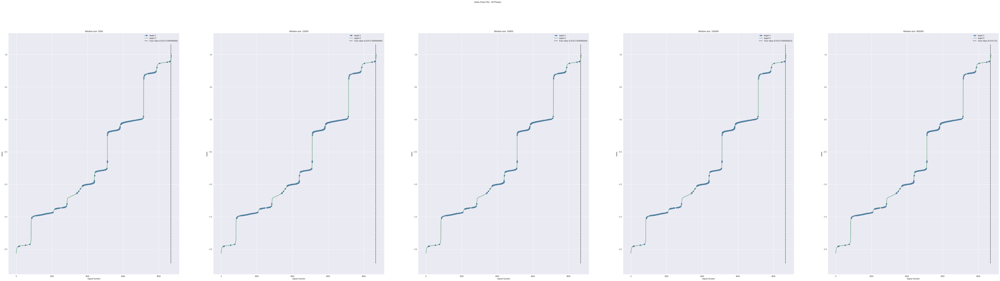

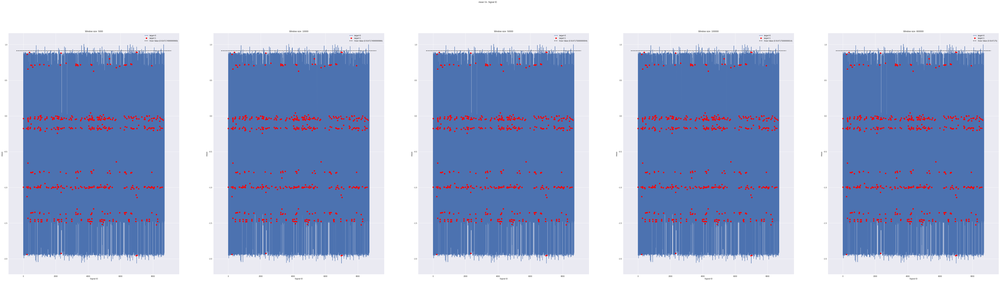

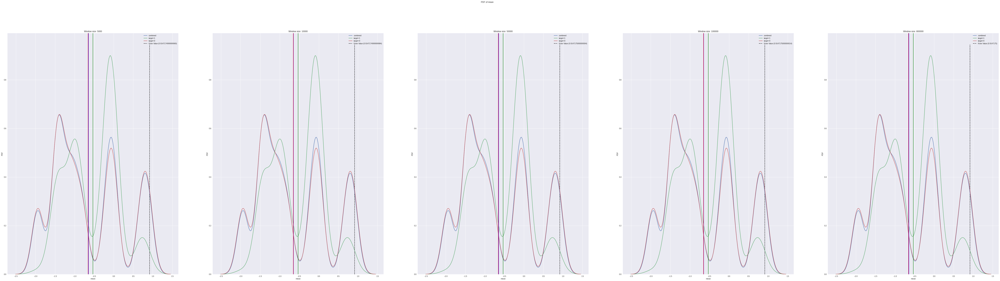

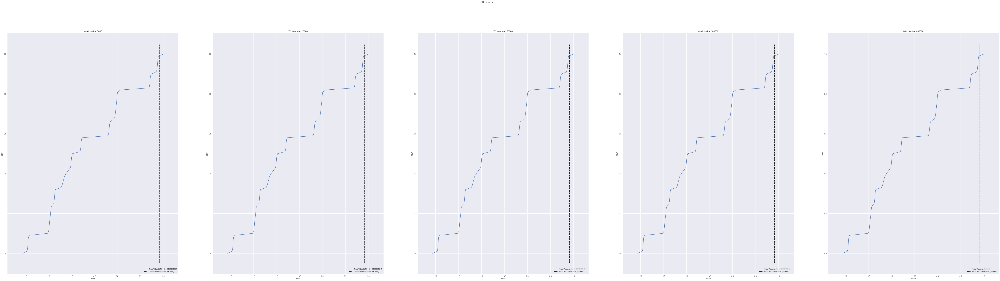

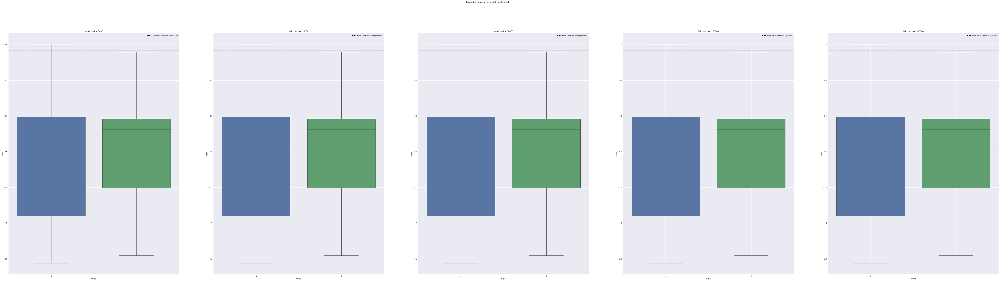

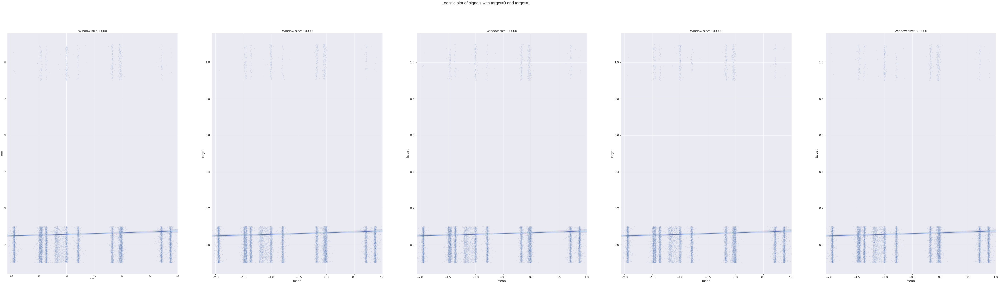

In [ ]:
plot_compare('mean', 'one_phase', plt_list, plot_names, df_arr)

Observations:
*  Knee plot
    *  A step like spread is observed indicating majority of th feature values taking a specific set of values.
    *  Each step can be considered as the knee value.
    *  The feature values for the signals with target=1 is spread out in the entire spectrum of the feature.
*  Feature vs. signal id
    *  Signals with target=1 can be seen to be concentrated around -1, 0, and 1.
    *  Feature values range approximately between -2 and 1.
    *  There seems to be no extreme values.
*  PDF
    *  Multiple peaks can be seen at around -1.5, 0, and 0.75 in both the signals with target=1 and target=0.
    *  Multiple valley can be seen at around -0.75, -0.5, and 0.25 in both the signals with target=1 and target=0.
    *  The distribution of both the signals with target=1 and target=0 look similar.
*  CDF
    *  A step like spread is observed indicating majority of th feature values taking a specific set of values.
    *  80% of the values are negative and 20% are positive.
*  Box plot
    *  IQRs of both the signals with target=1 and target=0 are in the range -1.5 and 0.
    *  IQR of signals with target=0 is greater than the IQR of signals with target=1.
*  Logistic plot
    *  Linearly separating the signals with target=1 and target=0 is not possible with this feature.
    *  The regions where the feature values exist for signals with target=1 and target=0 looks same.


##### Standard deviation

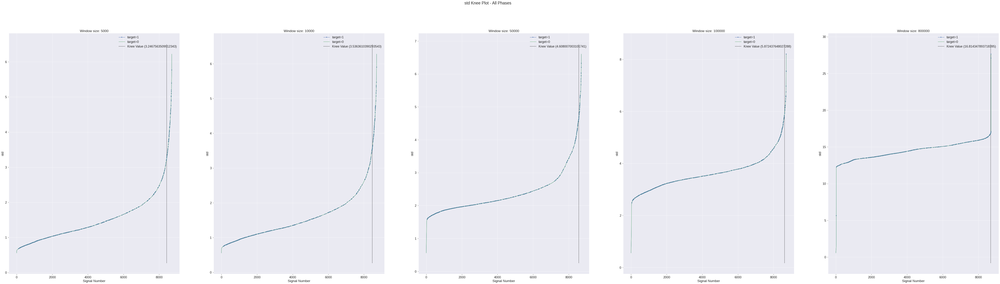

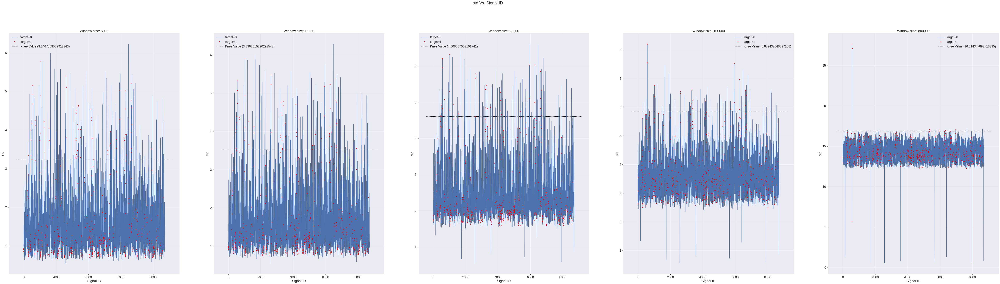

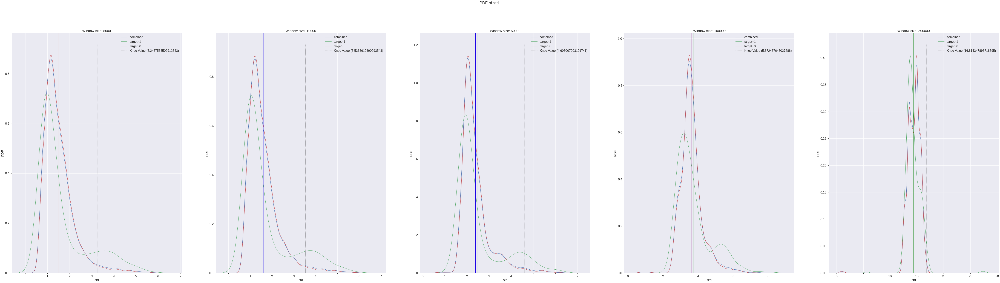

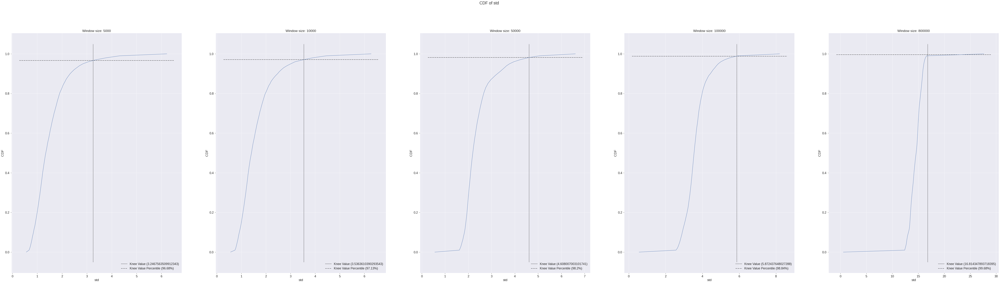

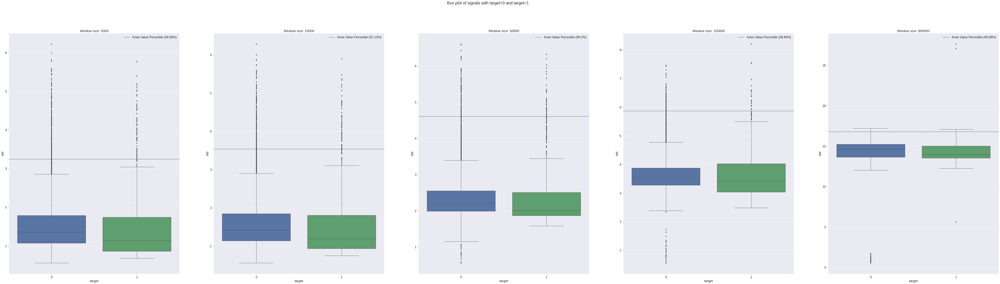

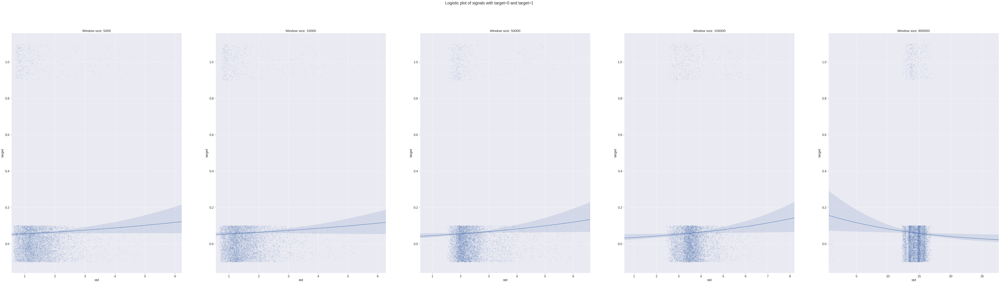

In [ ]:
plot_compare('std', 'one_phase', plt_list, plot_names, df_arr)

Observations:
*  Knee plot
    *  The feature values for the signals with target=1 is spread out in the entire spectrum of the feature.
*  Feature vs. signal id
    *  Number of outliers increases from window size of 50000 onwards.
*  PDF
    *  There is a major and minor peak for signal with target=1
    *  The distribution of both the signals with target=1 and target=0 look similar.
    *  There is skewness to the right especially after their respective mean values of the feature.    
*  CDF
    *  Around 98% of all the values are less than approximately 5.
    *  CDF of signal with window size 800000 is different from other window sizes. Majority of the values lie between 12.5 and 15
*  Box plot
    *  IQRs of both the signals with target=1 and target=0 are in the range 1 and 2.
    *  IQR of signals with target=0 is greater than the IQR of signals with target=1.
*  Logistic plot
    *  Linearly separating the signals with target=1 and target=0 is not possible with this feature.
    *  The regions where the feature values exist for signals with target=1 and target=0 looks same.


##### 0th percentile

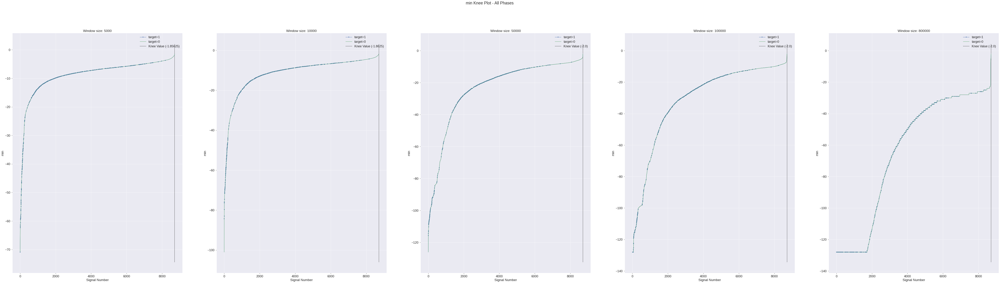

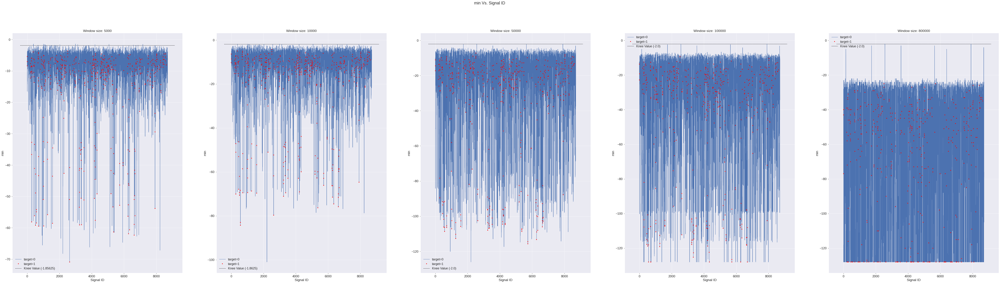

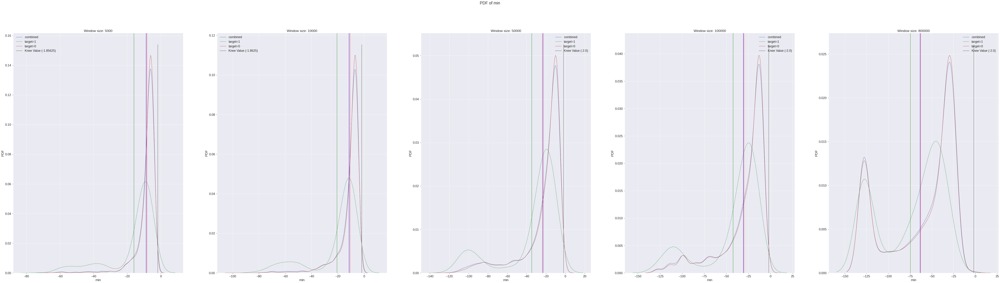

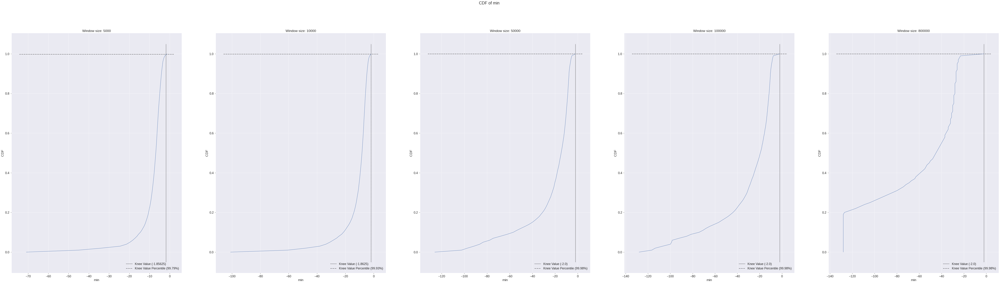

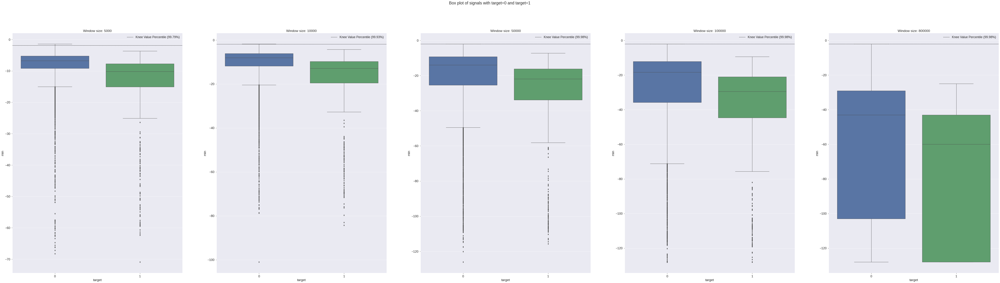

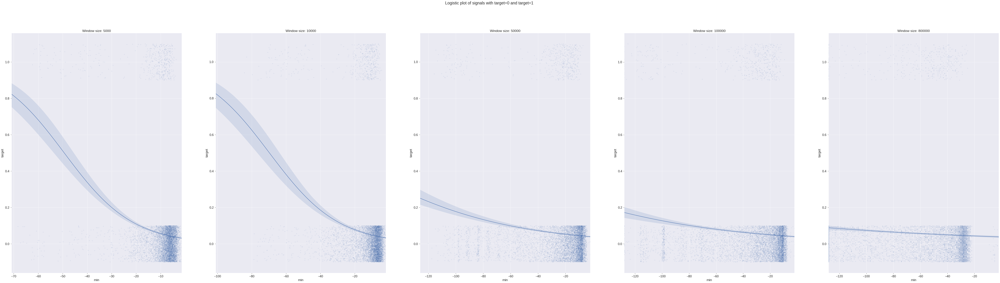

In [ ]:
plot_compare('min', 'one_phase', plt_list, plot_names, df_arr)

Observations:
*  Knee plot
    *  The feature values for the signals with target=1 is spread out in the entire spectrum of the feature.
*  Feature vs. signal id
    *  Signals with target=1 is spread out in the entire gamut of the values.
    *  All the feature values are negative.
*  PDF
    *  Height of the second smaller peak increases with increase in the window size.
    *  The distribution of both the signals with target=1 and target=0 look similar.
    *  Height of the signal with target=0 is more than the signal with target=1.
    *  There is long skewness to the left especially after their respective mean values of the feature.
    *  Peak of signal
*  CDF
    *  20% of the values are between -70 and -10 while 80% of the values are between -10 and 0.
*  Box plot
    *  Overlap of the IQRs of signal with target=1 and target=0 is more as window size increases.
*  Logistic plot
    *  Sigmoid like curve is present for window size 5000 and 10000. This indicates that there is to some extent a distinct linear separation of the values between target=0 and target=1 
    *  Linearly separating the signals with target=1 and target=0 is might be possible with this feature for window size 5000 and 10000

##### 25th percentile

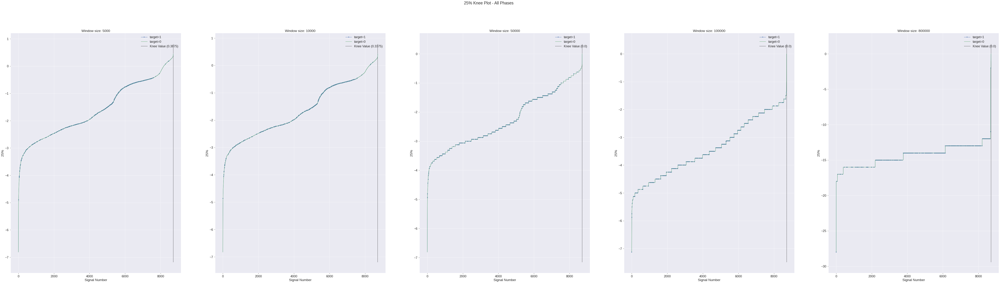

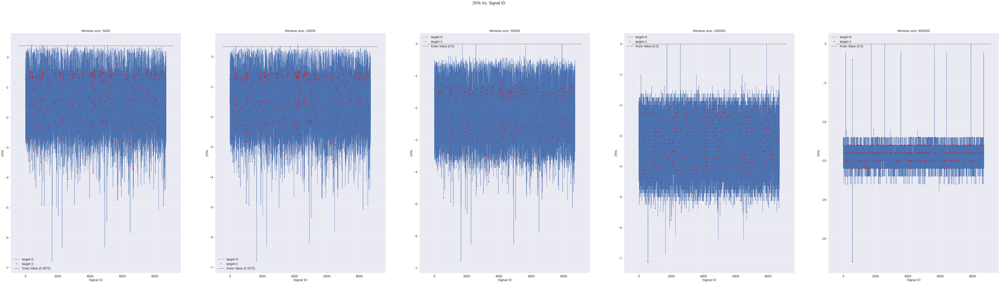

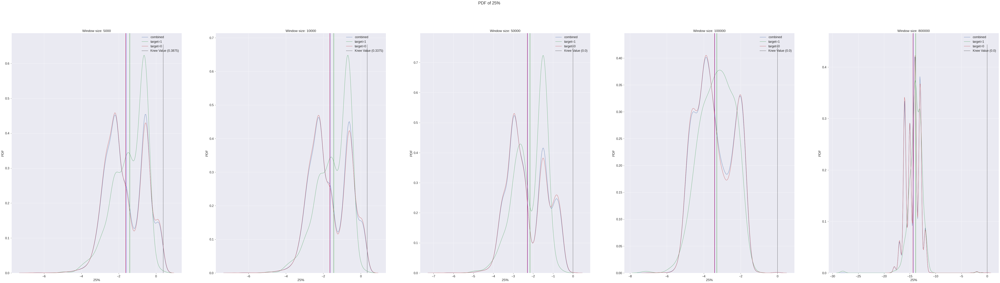

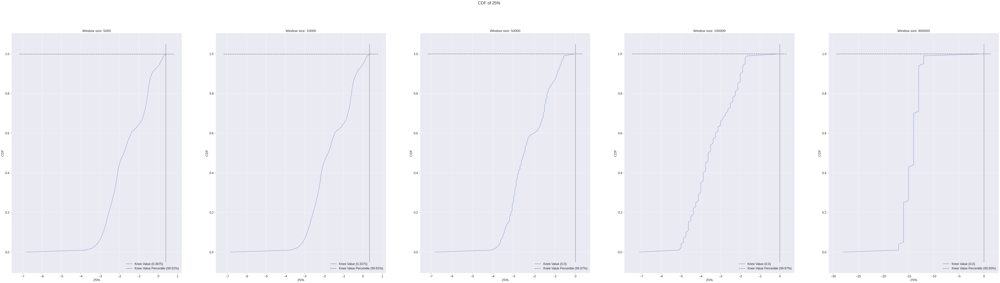

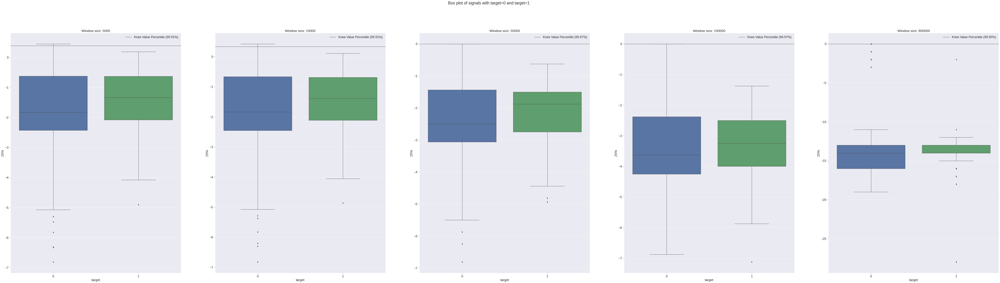

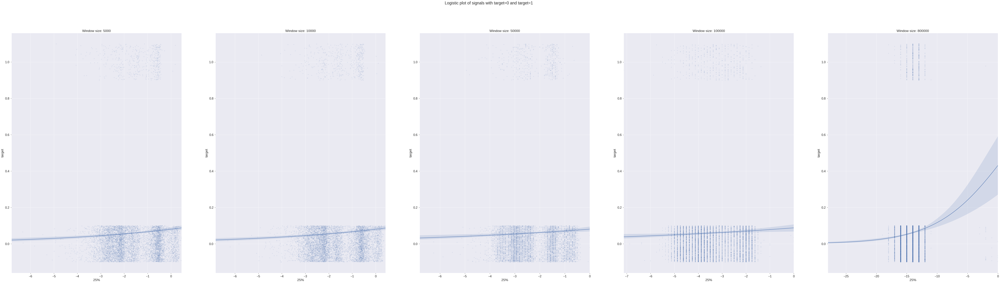

In [ ]:
plot_compare('25%', 'one_phase', plt_list, plot_names, df_arr)

Observations:
*  Knee plot
    *  The feature values for the signals with target=1 is spread out in the entire spectrum of the feature.
*  Feature vs. signal id
    *  Signals with target=1 is spread out in the entire gamut of the values.
    *  Majority of the feature values are negative.
    *  The highest negative value is around -7.
*  PDF
    *  Multiple peaks exist for signals with target=0 and target=1 for all the window sizes.
    *  The distribution of both the signals with target=1 and target=0 look similar.
*  Box plot
    *  IQRs of both the signals with target=1 and target=0 are in the same range.
*  Logistic plot
    *  Linearly separating the signals with target=1 and target=0 is not possible with this feature.

##### 50th percentile (Median)

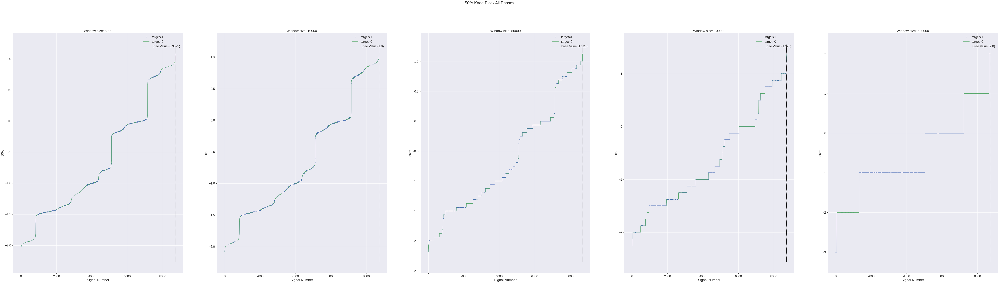

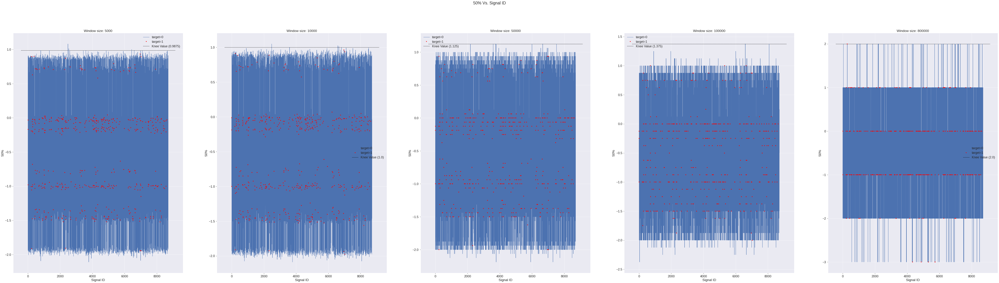

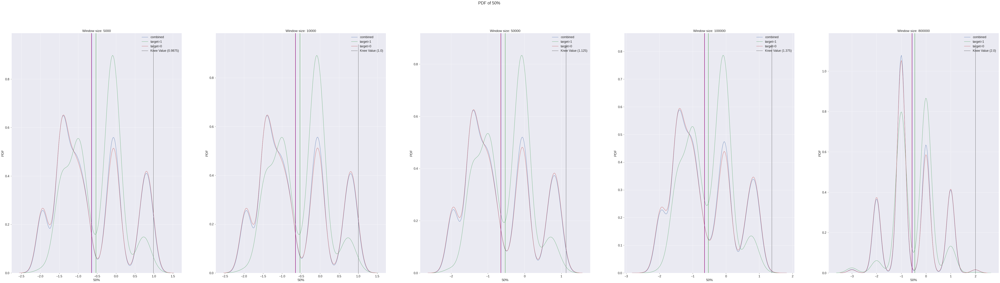

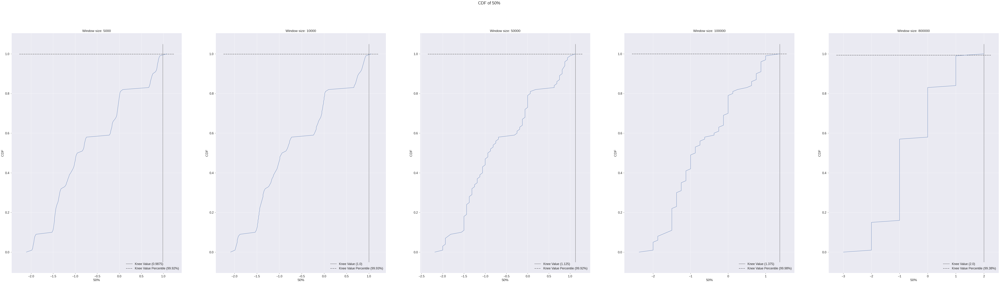

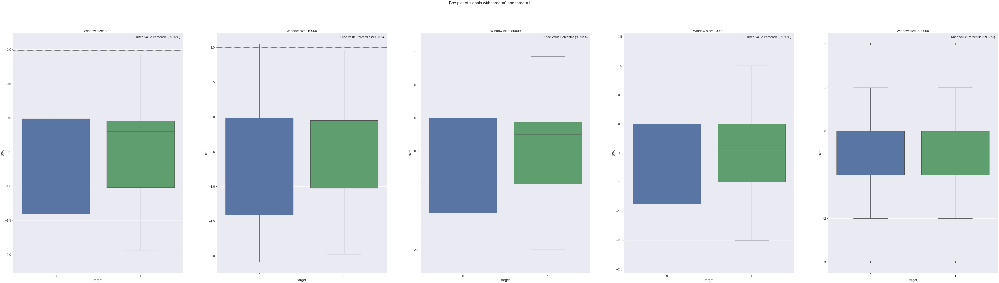

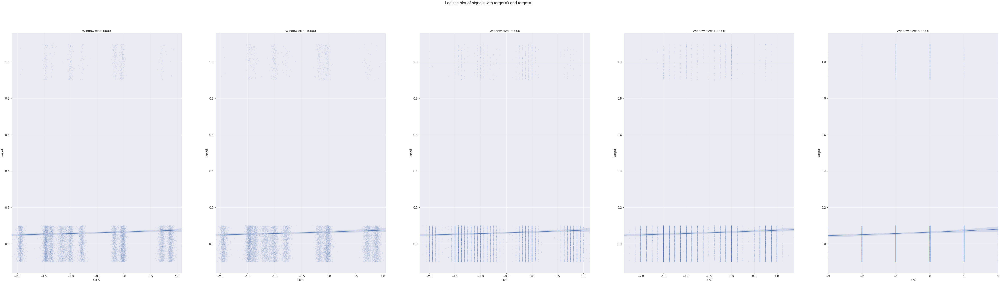

In [ ]:
plot_compare('50%', 'one_phase', plt_list, plot_names, df_arr)

Observations:
*  Knee plot
    *  A step like spread is observed indicating majority of th feature values taking a specific set of values.
    *  The feature values for the signals with target=1 is spread out in the entire spectrum of the feature.
*  Feature vs. signal id
    *  There seems to be no extreme values except for window size 800000
*  PDF
    *  Multiple peaks and valleys can be seen in both the signals with target=1 and target=0.
    *  The distribution of both the signals with target=1 and target=0 look similar.
*  CDF
    *  A step like spread is observed indicating majority of th feature values taking a specific set of values.
*  Box plot
    *  IQRs of both the signals with target=1 and target=0 are in the same range.
*  Logistic plot
    *  Linearly separating the signals with target=1 and target=0 is not possible with this feature.

##### 75th percentile

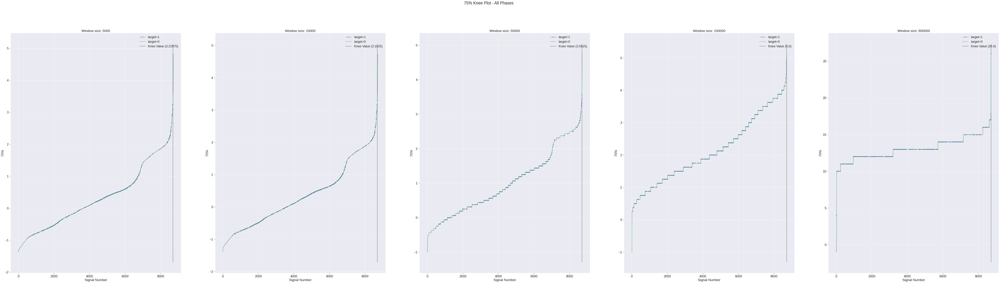

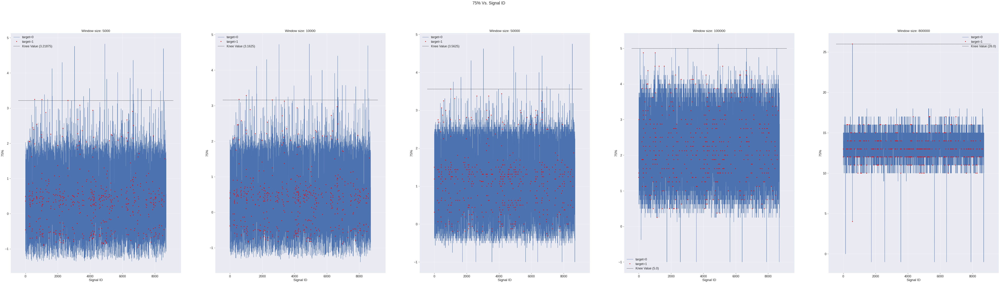

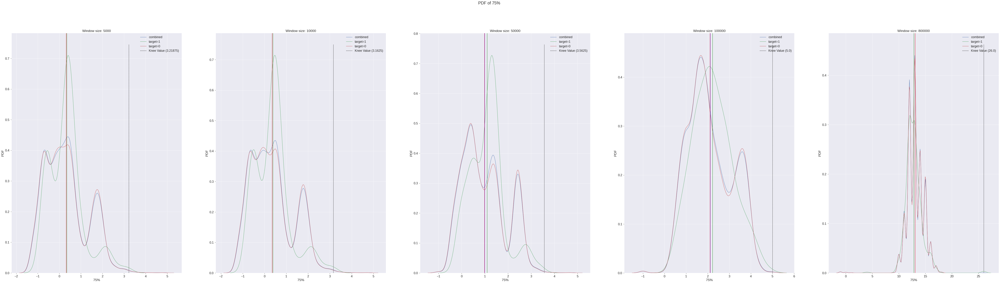

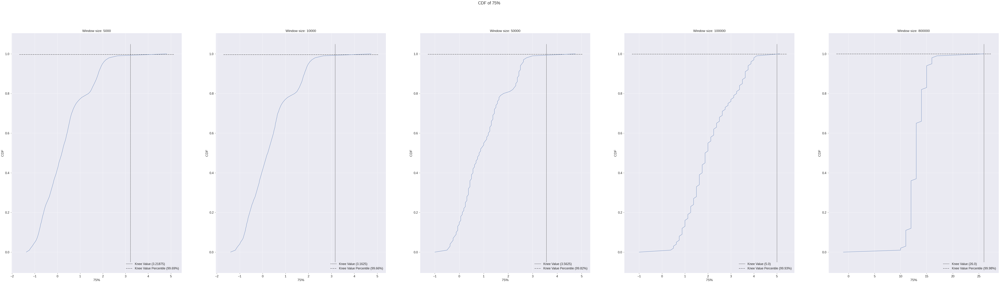

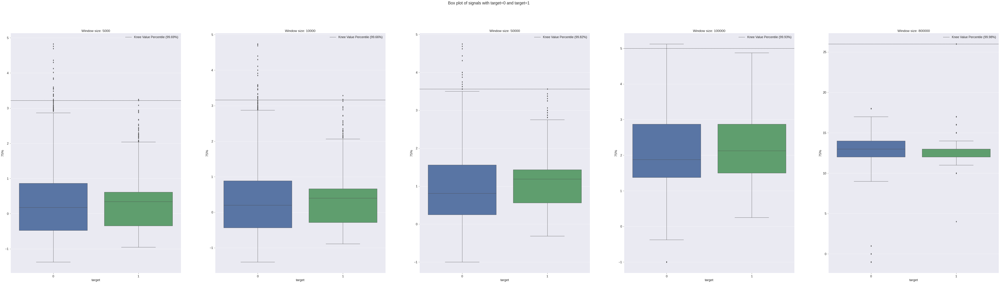

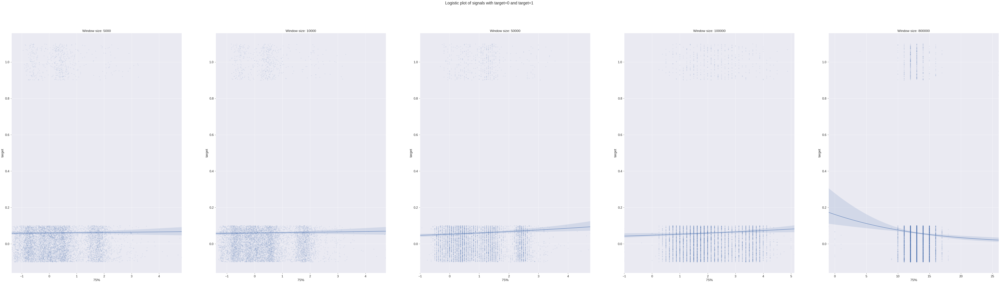

In [ ]:
plot_compare('75%', 'one_phase', plt_list, plot_names, df_arr)

Observations:
*  Knee plot
    *  The feature values for the signals with target=1 is spread out in the entire spectrum of the feature.
*  PDF
    *  Multiple peaks exist for signals with target=0.
    *  Single peak exists for signals with target=1.
    *  The distribution of both the signals with target=1 and target=0 look similar.
*  Box plot
    *  IQRs of both the signals with target=1 and target=0 are in the same range.
*  Logistic plot
    *  Linearly separating the signals with target=1 and target=0 is not possible with this feature.

##### 100th percentile

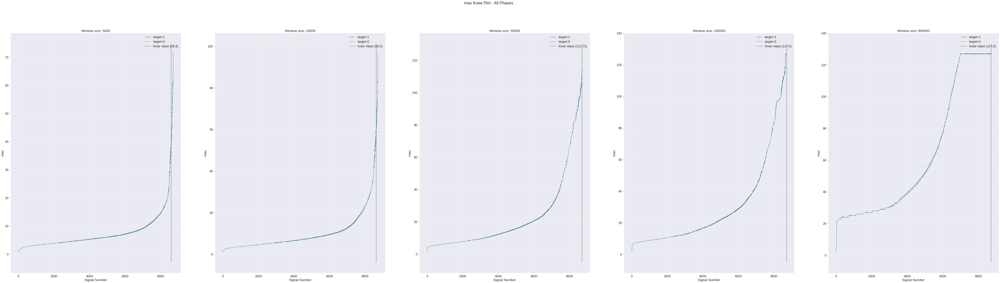

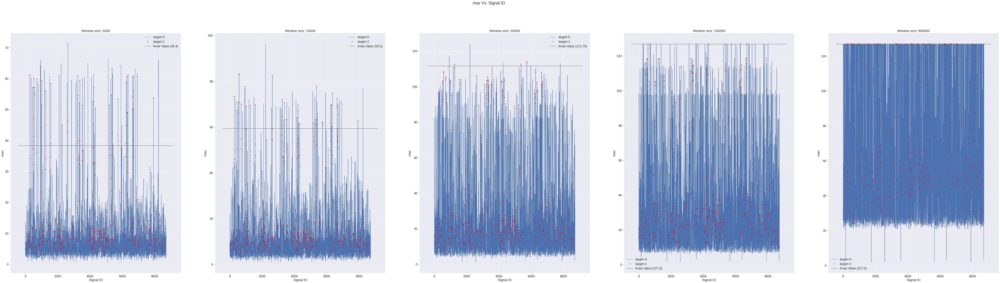

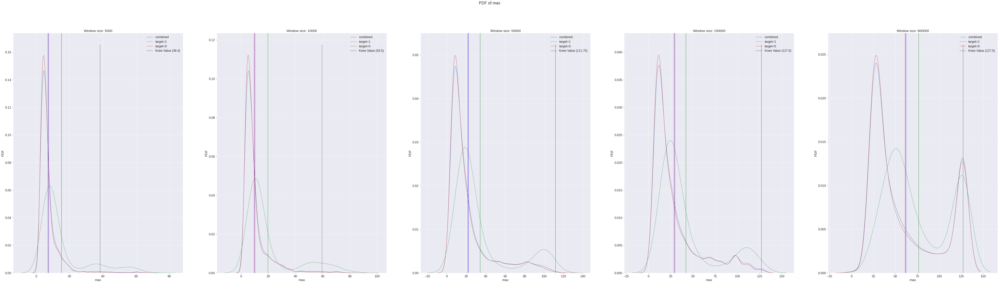

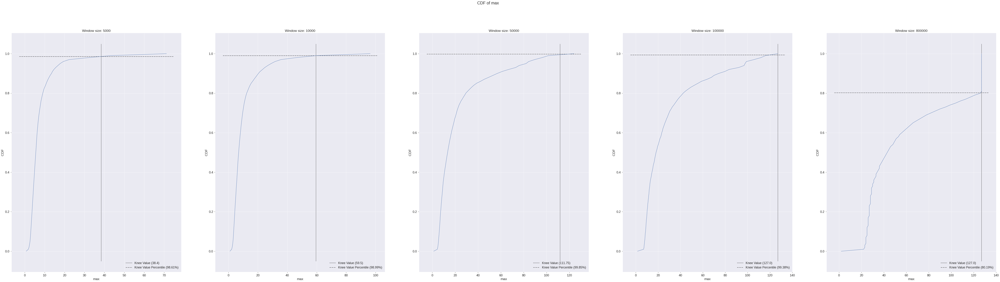

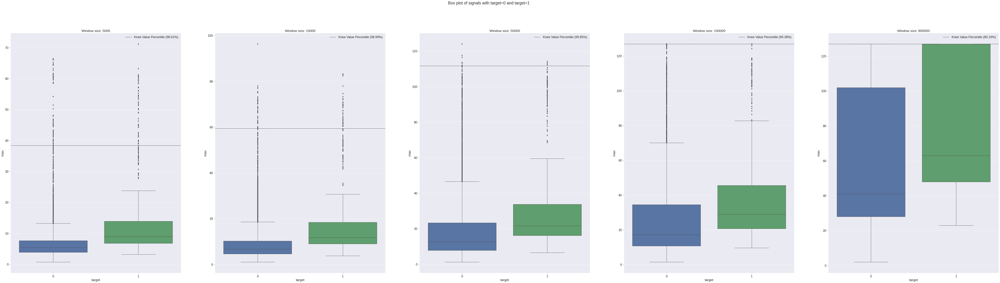

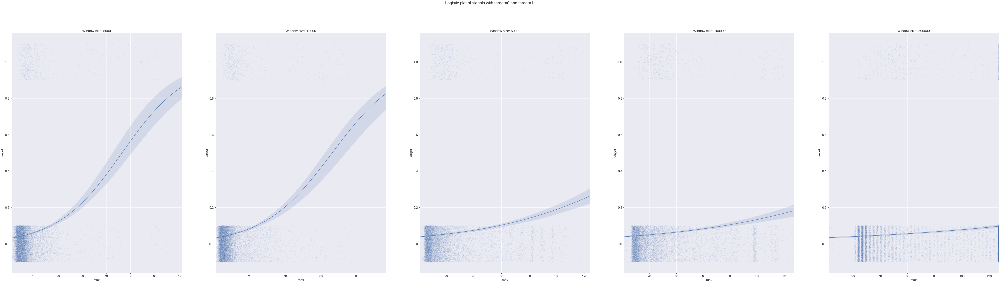

In [ ]:
plot_compare('max', 'one_phase', plt_list, plot_names, df_arr)

bservations:
*  Knee plot
    *  The feature values for the signals with target=1 is spread out in the entire spectrum of the feature.
*  Feature vs. signal id
    *  Signals with target=1 is spread out in the entire gamut of the values.
    *  All the feature values are positive.
    *  There are some extreme values.
*  PDF
    *  Peak of signal with target=1 is smaller than signal with target=0.
    *  The second smaller peak of signal with target=1 increases with window size.
    *  The distribution of both the signals with target=1 and target=0 look similar.
*  Box plot
    *  There is a small separation of IQRs of the signals with target=1 and target=0 for widow size 5000 and 10000
*  Logistic plot
    *  Sigmoid like curve is present for window size 5000 and 10000. This indicates that there is to some extent a distinct linear separation of the values between target=0 and target=1
    *  Linearly separating the signals with target=1 and target=0 is might be possible with this feature.

#### Test Data

In [ ]:
window_sizes = [5000, 10000, 50000, 100000, 800000]
df_arr = []

for wind in window_sizes:
    save_file_path = path + f'test_path/stats_df_single_wind_{wind}_test.csv'
    df_arr.append(describe_signal_dn(wind, save_file_path, 'test'))